# Load the data

In [1]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the CSV file
df = pd.read_csv("data/1.5k_cleaned_data.csv", encoding="utf-8")

# Display the first few rows to verify the data
print("First few rows of the dataset:")
print("\nRenaming columns:")
df = df.rename(
    columns={
        "stock__share_type__company__industry__industry_group__sector__name": "sector",
        "stock__share_type__company__country__code": "country",
        "stock__share_type__company__name": "company",
    }
)
df.head()

print("\nShape of the dataset:")
print(df.shape)
print(df.columns)

First few rows of the dataset:

Renaming columns:

Shape of the dataset:
(1975, 18)
Index(['stock__ticker', 'company', 'sector', 'country', 'date', 'quality',
       'growth', 'value', 'dividend', 'market_cap_usd', 'enterprise_value_usd',
       'volume', 'profit_1m', 'profit_3m', 'profit_6m', 'profit_1y',
       'profit_2y', 'profit_5y'],
      dtype='object')


# Correlations

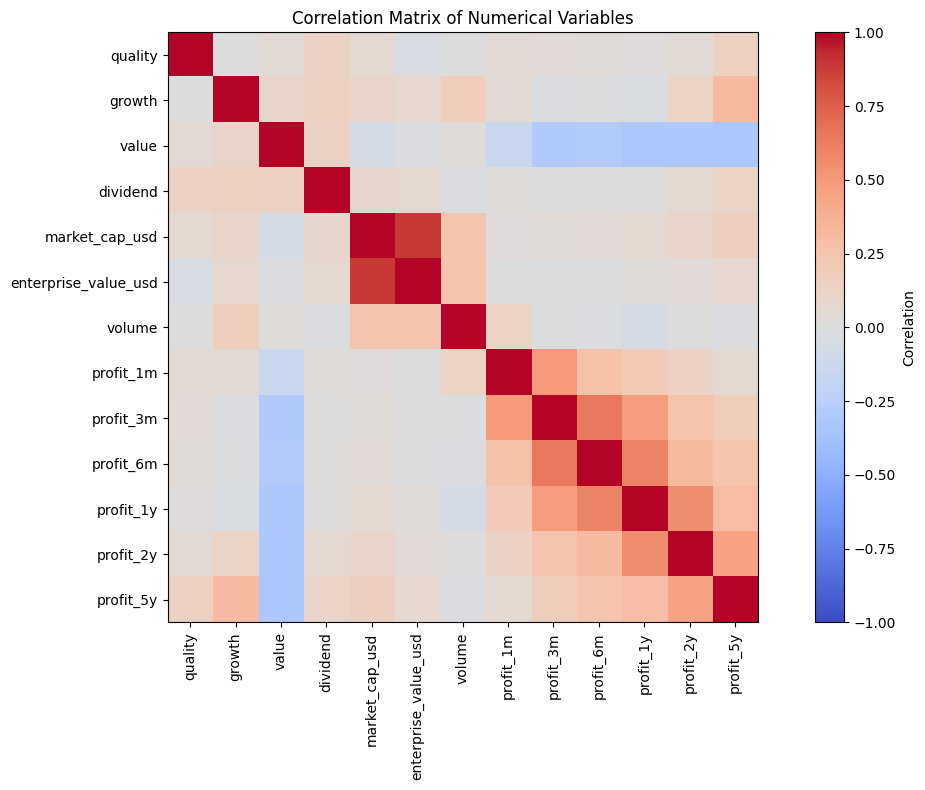

In [2]:
# Lets look for correlations between the variables
# Create a correlation matrix with only numerical columns
df_numeric = df.select_dtypes(include=["float64", "int64"])
correlation_matrix = df_numeric.corr()

# Plot the correlation matrix as a heatmap
plt.figure(figsize=(12, 8))
plt.imshow(correlation_matrix, cmap="coolwarm", vmin=-1, vmax=1)
plt.colorbar(label="Correlation")
plt.xticks(
    range(len(correlation_matrix.columns)), correlation_matrix.columns, rotation=90
)
plt.yticks(range(len(correlation_matrix.columns)), correlation_matrix.columns)
plt.title("Correlation Matrix of Numerical Variables")
plt.tight_layout()
plt.show()

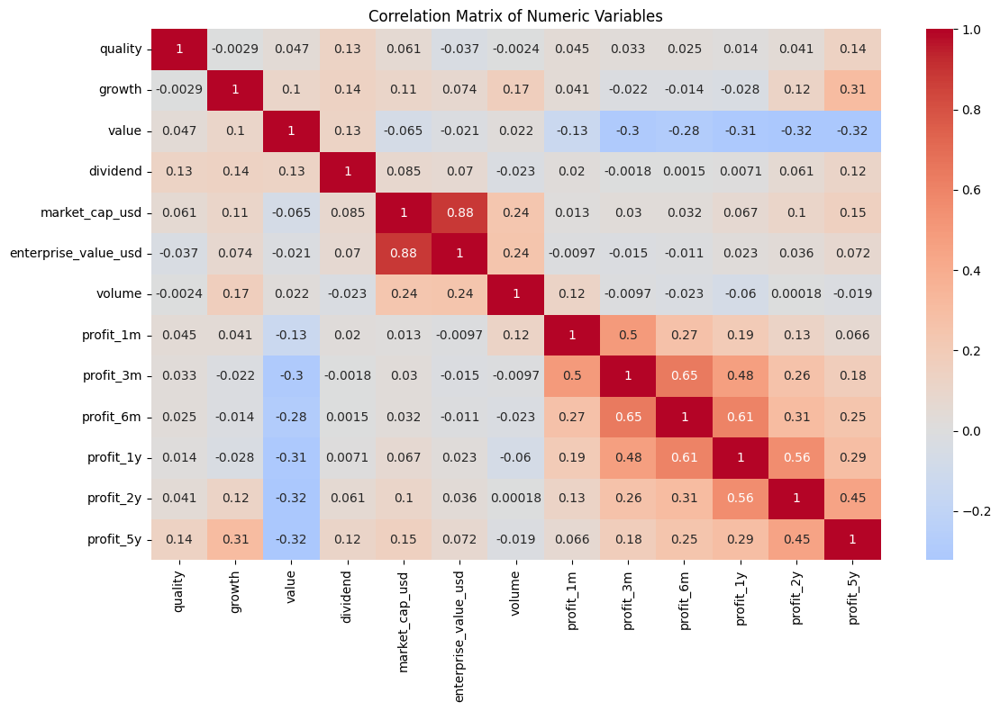

In [3]:
# Select only numeric columns
scores = [
    "quality",
    "growth",
    "value",
    "dividend",
    "market_cap_usd",
    "enterprise_value_usd",
    "volume",
    "profit_1m",
    "profit_3m",
    "profit_6m",
    "profit_1y",
    "profit_2y",
    "profit_5y",
]

# Create correlation matrix using numeric columns only
df_numeric = df[scores]
correlation_matrix = df_numeric.corr()

# Plot using seaborn for better visualization
import seaborn as sns

plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", center=0)
plt.title("Correlation Matrix of Numeric Variables")
plt.tight_layout()
plt.show()

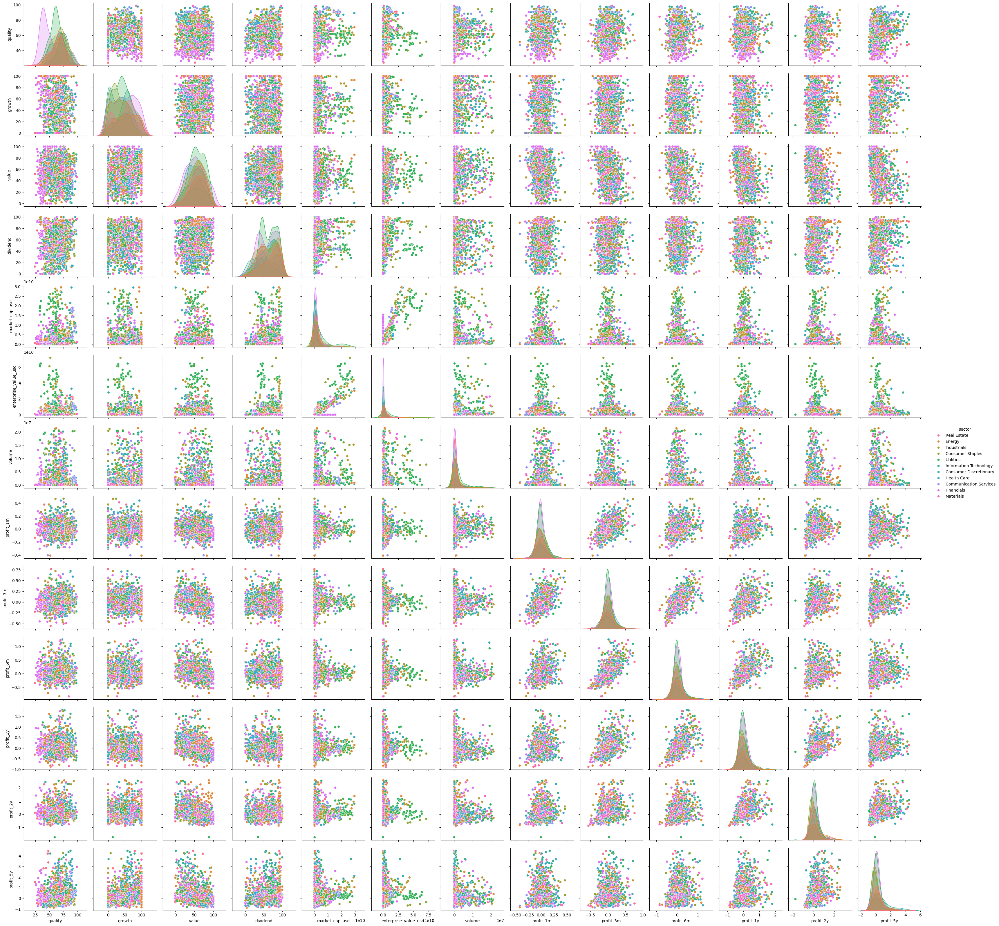

In [4]:
# for target_profit in [
#     "profit_1m",
#     "profit_3m",
#     "profit_6m",
#     "profit_1y",
#     "profit_2y",
#     "profit_5y",
# ]:
#     scores = [
#         "quality",
#         "growth",
#         "value",
#         "dividend",
#         target_profit,
#         "sector",
#     ]

# Create pairplot using the correct dataframe and columns
sns.pairplot(
    df,
    hue="sector",
)
plt.show()

# PCA

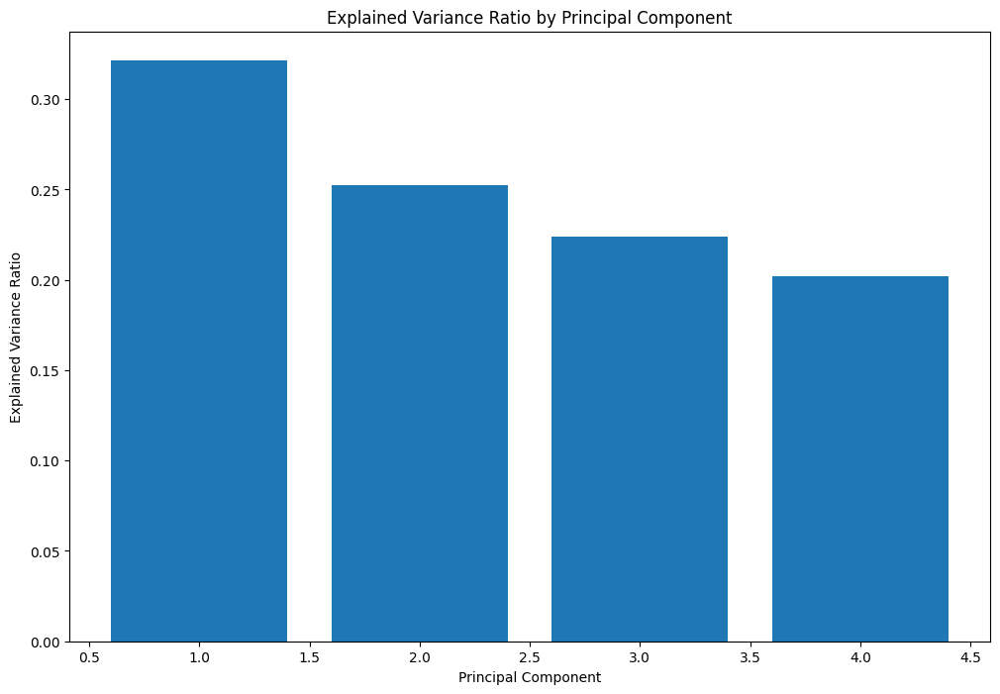

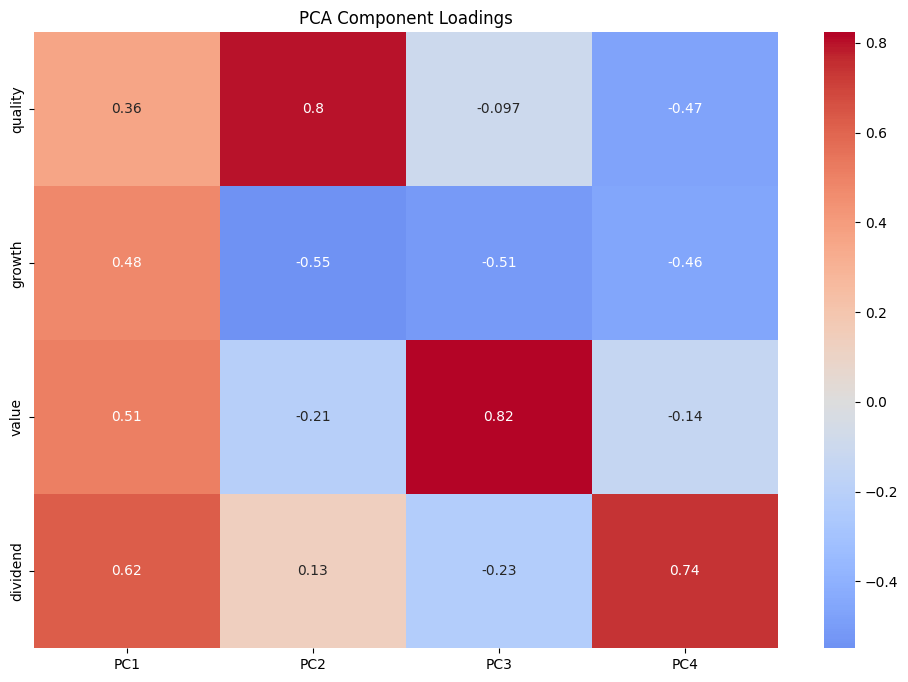

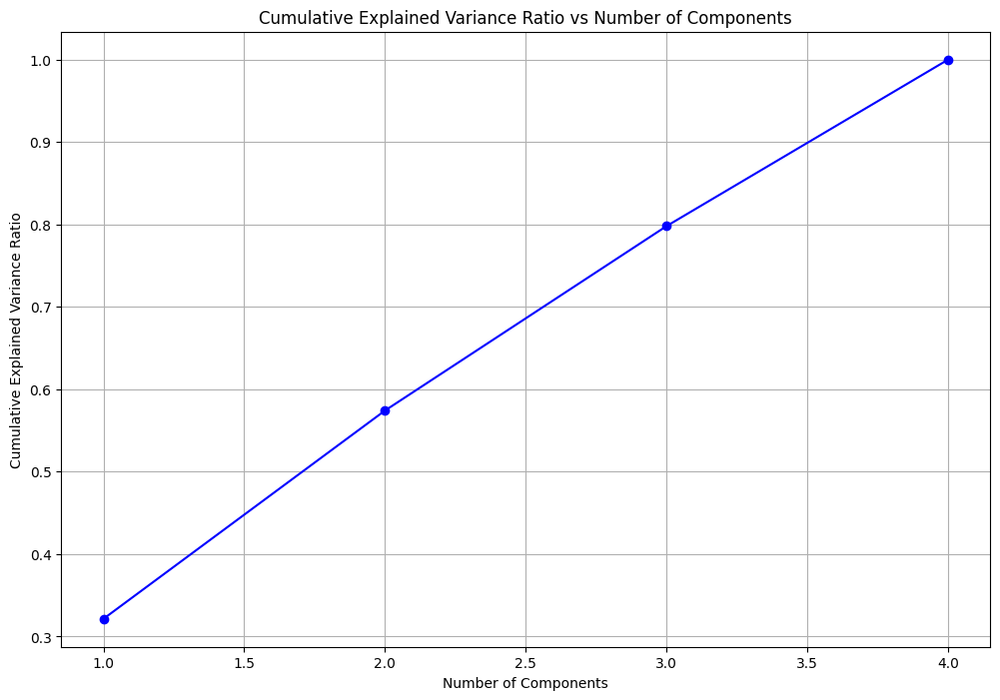

In [5]:
import scipy
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import numpy as np

# Prepare data for PCA
features = [
    "quality",
    "growth",
    "value",
    "dividend",
]
X = df[features]

# Standardize the features


scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply PCA

pca = PCA()
X_pca = pca.fit_transform(X_scaled)

# Calculate explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_

# Plot explained variance ratio
plt.figure(figsize=(12, 8))
plt.bar(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio)
plt.xlabel("Principal Component")
plt.ylabel("Explained Variance Ratio")
plt.title("Explained Variance Ratio by Principal Component")
plt.show()

# Create a DataFrame with component loadings
loadings = pd.DataFrame(
    pca.components_.T, columns=["PC1", "PC2", "PC3", "PC4"], index=features
)

# Plot heatmap of component loadings
plt.figure(figsize=(12, 8))
sns.heatmap(loadings, annot=True, cmap="coolwarm", center=0)
plt.title("PCA Component Loadings")
plt.show()

# Calculate cumulative explained variance ratio
cumulative_variance_ratio = np.cumsum(explained_variance_ratio)
plt.figure(figsize=(12, 8))
plt.plot(range(1, len(cumulative_variance_ratio) + 1), cumulative_variance_ratio, "bo-")
plt.xlabel("Number of Components")
plt.ylabel("Cumulative Explained Variance Ratio")
plt.title("Cumulative Explained Variance Ratio vs Number of Components")
plt.grid(True)
plt.show()

# Checking on outliers

9.525058637153919 13.341766112353717


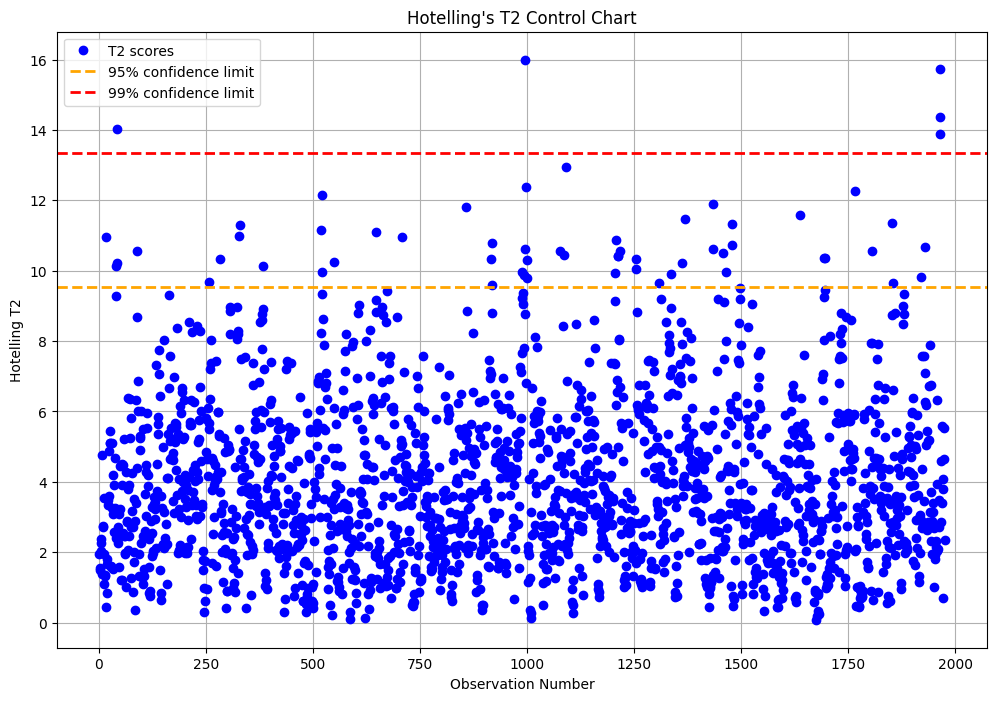

In [6]:
# Calculate Hotelling's T2 statistic
K = 4  # Number of principal components to use
scores = X_pca[:, :K]
t2_scores = np.sum(scores**2 / pca.explained_variance_[:K], axis=1)

# Calculate F-distribution critical values
n = len(X)  # Number of observations
F95 = (
    K * (n**2 - 1) / (n * (n - K)) * scipy.stats.f.ppf(0.95, K, n - K)
)  # ppf is the percent point function (inverse of cdf) of the F distribution
F99 = K * (n**2 - 1) / (n * (n - K)) * scipy.stats.f.ppf(0.99, K, n - K)
print(F95, F99)
# Plot Hotelling's T2
plt.figure(figsize=(12, 8))
plt.plot(range(1, len(t2_scores) + 1), t2_scores, "bo", label="T2 scores")
plt.axhline(
    y=F95, color="orange", linestyle="--", linewidth=2, label="95% confidence limit"
)
plt.axhline(
    y=F99, color="red", linestyle="--", linewidth=2, label="99% confidence limit"
)
plt.xlabel("Observation Number")
plt.ylabel("Hotelling T2")
plt.title("Hotelling's T2 Control Chart")
plt.legend()
plt.grid(True)
plt.show()

In [7]:
# Delete the outliers
df = df[t2_scores < F95]
X = df[features]
X_scaled = scaler.fit_transform(X)
X_pca = pca.fit_transform(X_scaled)

Correlations with profit_1m:
 PC1   -0.003525
PC2    0.067424
PC3   -0.126207
PC4    0.012848
Name: profit_1m, dtype: float64


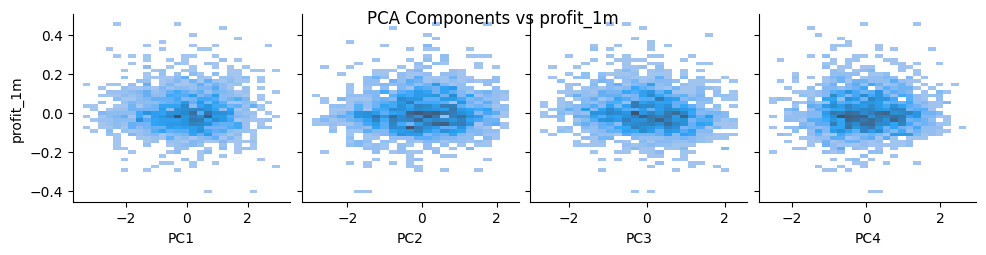

Correlations with profit_3m:
 PC1         -0.123876
PC2          0.130082
PC3         -0.226241
PC4          0.065542
profit_1m    0.487381
Name: profit_3m, dtype: float64


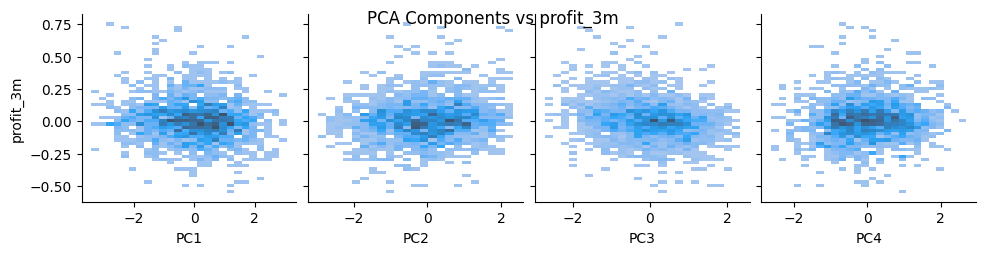

Correlations with profit_6m:
 PC1         -0.118346
PC2          0.113890
PC3         -0.224816
PC4          0.059129
profit_1m    0.252876
profit_3m    0.640749
Name: profit_6m, dtype: float64


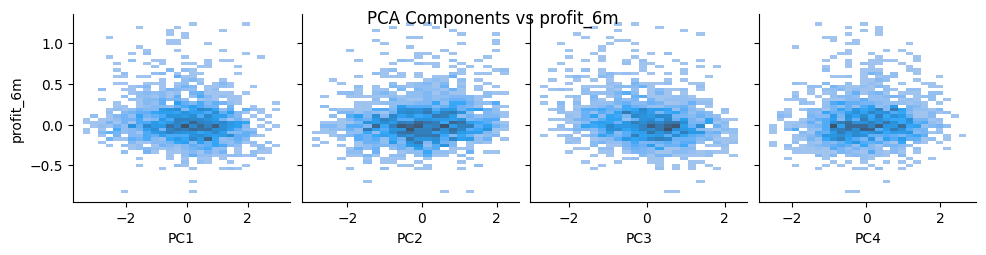

Correlations with profit_1y:
 PC1         -0.136472
PC2          0.131843
PC3         -0.232864
PC4          0.083992
profit_1m    0.179721
profit_3m    0.470215
profit_6m    0.601357
Name: profit_1y, dtype: float64


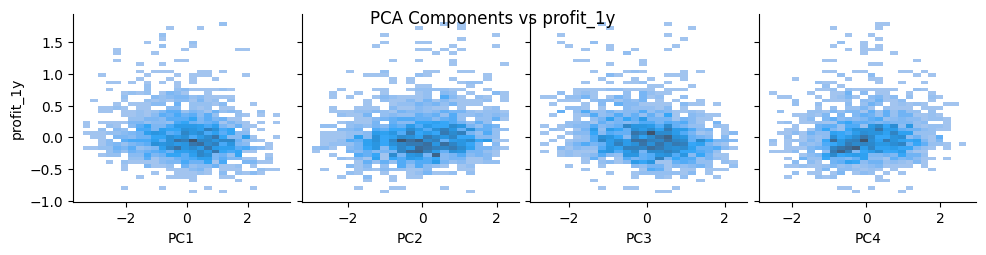

Correlations with profit_2y:
 PC1         -0.027935
PC2          0.118540
PC3         -0.336217
PC4          0.048510
profit_1m    0.121545
profit_3m    0.256897
profit_6m    0.311469
profit_1y    0.565929
Name: profit_2y, dtype: float64


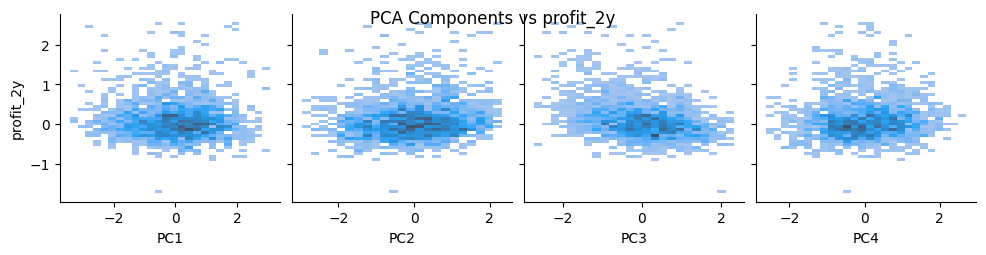

Correlations with profit_5y:
 PC1          0.114008
PC2          0.138107
PC3         -0.469913
PC4         -0.037723
profit_1m    0.060159
profit_3m    0.165728
profit_6m    0.251571
profit_1y    0.297047
profit_2y    0.443905
Name: profit_5y, dtype: float64


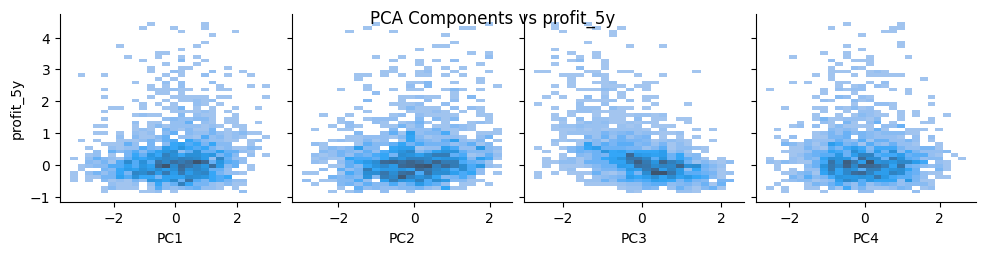

In [8]:
df_pca = pd.DataFrame(X_pca, columns=["PC1", "PC2", "PC3", "PC4"])

for target_profit in [
    "profit_1m",
    "profit_3m",
    "profit_6m",
    "profit_1y",
    "profit_2y",
    "profit_5y",
]:
    df_pca[target_profit] = df[target_profit].values  # repeat per target

    sns.pairplot(
        df_pca,
        x_vars=["PC1", "PC2", "PC3", "PC4"],
        y_vars=target_profit,
        kind="hist",
    )
    plt.suptitle(f"PCA Components vs {target_profit}")
    correlations = df_pca.corr()[target_profit].drop(target_profit)
    print(f"Correlations with {target_profit}:\n", correlations)
    plt.show()

### Contribution to each variable

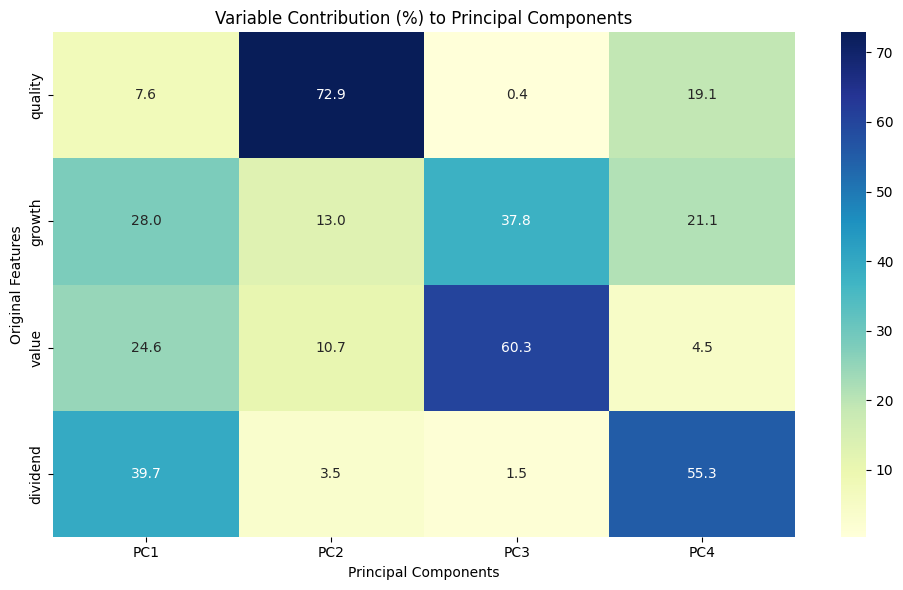

In [9]:
loadings = pd.DataFrame(
    pca.components_.T, columns=["PC1", "PC2", "PC3", "PC4"], index=features
)
# Square the loadings
squared_loadings = loadings**2

# Normalize by each component to get % contribution
contributions = squared_loadings.div(squared_loadings.sum(axis=0), axis=1) * 100

plt.figure(figsize=(10, 6))
sns.heatmap(contributions, annot=True, cmap="YlGnBu", fmt=".1f")
plt.title("Variable Contribution (%) to Principal Components")
plt.ylabel("Original Features")
plt.xlabel("Principal Components")
plt.tight_layout()
plt.show()

# Linear regression

In [10]:
from sklearn.linear_model import LinearRegression

for target_profit in [
    "profit_1m",
    "profit_3m",
    "profit_6m",
    "profit_1y",
    "profit_2y",
    "profit_5y",
]:
    X = df_pca[["PC1", "PC2", "PC3", "PC4"]]  # or include more PCs
    y = df_pca[target_profit]

    model = LinearRegression()
    model.fit(X, y)
    r2 = model.score(X, y)
    print(f"R^2 for predicting {target_profit} from PCs: {r2:.3f}")

R^2 for predicting profit_1m from PCs: 0.021
R^2 for predicting profit_3m from PCs: 0.088
R^2 for predicting profit_6m from PCs: 0.081
R^2 for predicting profit_1y from PCs: 0.097
R^2 for predicting profit_2y from PCs: 0.130
R^2 for predicting profit_5y from PCs: 0.254


# ARIMAX


ARIMAX Analysis for profit_1m
----------------------------------------


/Users/carlosedm10/projects/fundamental-scores-analysis/venv/lib/python3.13/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/Users/carlosedm10/projects/fundamental-scores-analysis/venv/lib/python3.13/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)


AIC: -3414.38
BIC: -3375.68


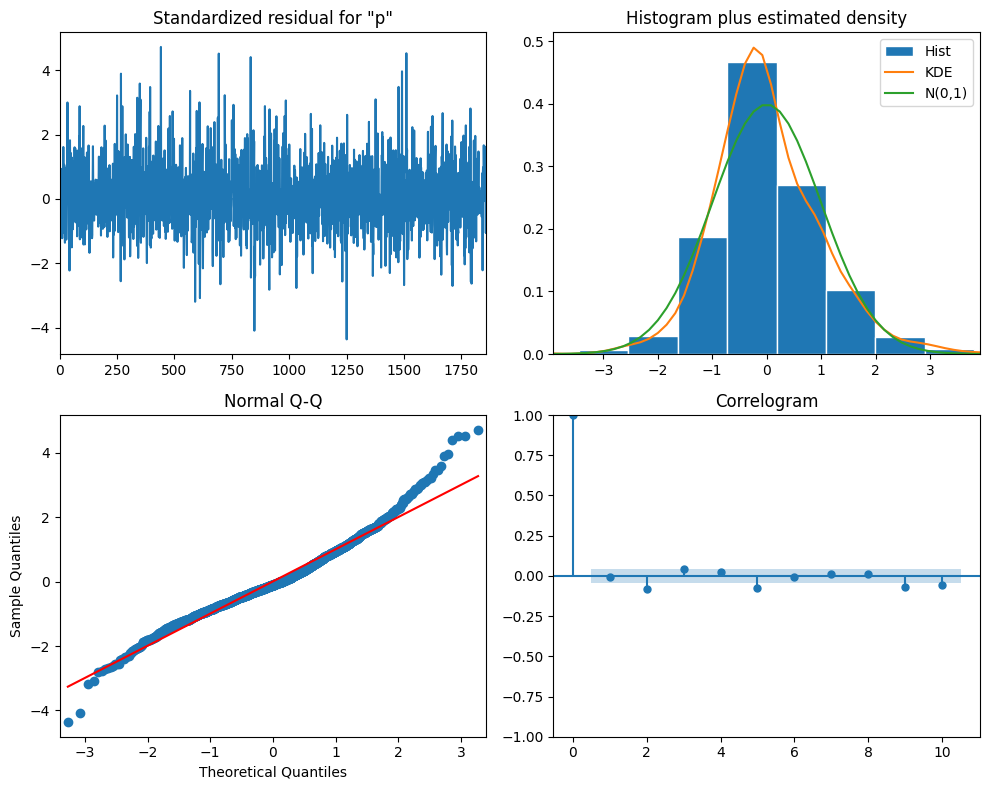


Exogenous Variables Summary:
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
PC1           -0.0003      0.002     -0.166      0.868      -0.004       0.003
PC2            0.0060      0.002      2.807      0.005       0.002       0.010
PC3           -0.0126      0.002     -5.456      0.000      -0.017      -0.008
PC4            0.0020      0.002      0.831      0.406      -0.003       0.007
ar.L1         -0.0676      0.022     -3.057      0.002      -0.111      -0.024
ma.L1         -1.0000      0.418     -2.390      0.017      -1.820      -0.180
sigma2         0.0092      0.004      2.389      0.017       0.002       0.017

ARIMAX Analysis for profit_3m
----------------------------------------


/Users/carlosedm10/projects/fundamental-scores-analysis/venv/lib/python3.13/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/Users/carlosedm10/projects/fundamental-scores-analysis/venv/lib/python3.13/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)


AIC: -1910.56
BIC: -1871.86


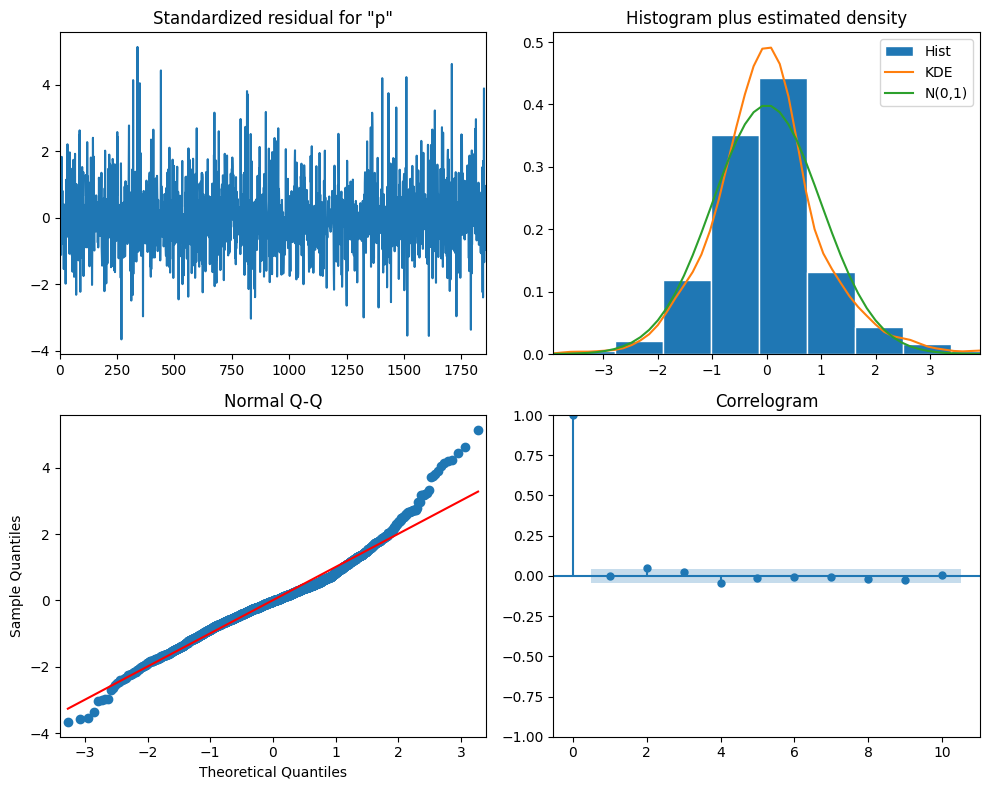


Exogenous Variables Summary:
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
PC1           -0.0175      0.003     -6.118      0.000      -0.023      -0.012
PC2            0.0191      0.004      5.461      0.000       0.012       0.026
PC3           -0.0366      0.004    -10.022      0.000      -0.044      -0.029
PC4            0.0116      0.004      3.046      0.002       0.004       0.019
ar.L1          0.0260      0.022      1.177      0.239      -0.017       0.069
ma.L1         -1.0000      0.479     -2.087      0.037      -1.939      -0.061
sigma2         0.0207      0.010      2.087      0.037       0.001       0.040

ARIMAX Analysis for profit_6m
----------------------------------------


/Users/carlosedm10/projects/fundamental-scores-analysis/venv/lib/python3.13/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/Users/carlosedm10/projects/fundamental-scores-analysis/venv/lib/python3.13/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)


AIC: -131.04
BIC: -92.35


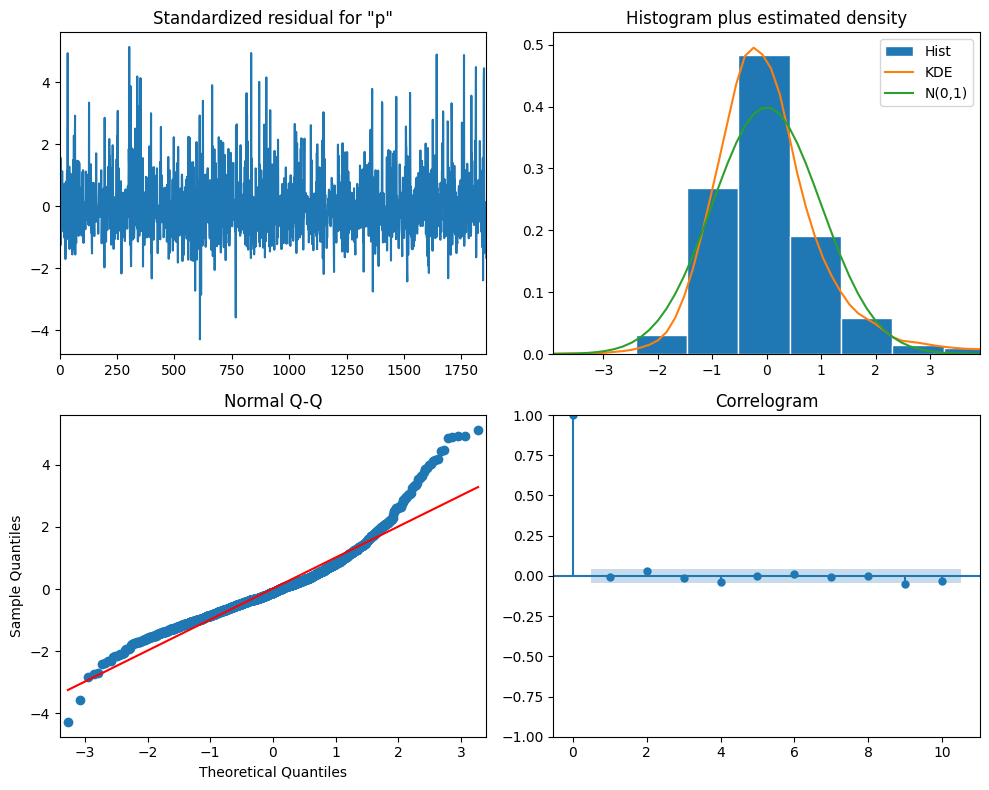


Exogenous Variables Summary:
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
PC1           -0.0289      0.005     -5.880      0.000      -0.039      -0.019
PC2            0.0278      0.006      4.671      0.000       0.016       0.039
PC3           -0.0623      0.006    -10.381      0.000      -0.074      -0.051
PC4            0.0207      0.007      2.997      0.003       0.007       0.034
ar.L1          0.1585      0.018      8.845      0.000       0.123       0.194
ma.L1         -1.0000      0.658     -1.519      0.129      -2.290       0.290
sigma2         0.0540      0.036      1.515      0.130      -0.016       0.124

ARIMAX Analysis for profit_1y
----------------------------------------


/Users/carlosedm10/projects/fundamental-scores-analysis/venv/lib/python3.13/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/Users/carlosedm10/projects/fundamental-scores-analysis/venv/lib/python3.13/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)


AIC: 820.89
BIC: 859.59


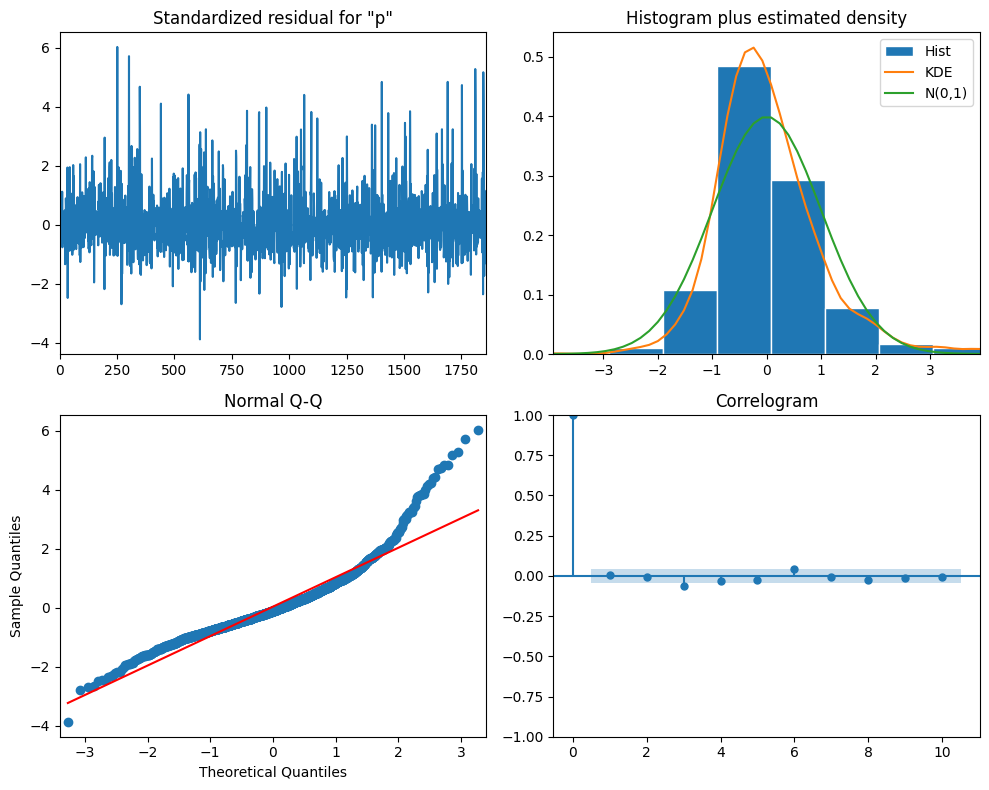


Exogenous Variables Summary:
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
PC1           -0.0406      0.006     -6.331      0.000      -0.053      -0.028
PC2            0.0458      0.009      5.388      0.000       0.029       0.062
PC3           -0.0886      0.008    -11.151      0.000      -0.104      -0.073
PC4            0.0362      0.009      3.874      0.000       0.018       0.055
ar.L1          0.3199      0.016     20.083      0.000       0.289       0.351
ma.L1         -1.0000      0.802     -1.247      0.212      -2.572       0.572
sigma2         0.0900      0.073      1.238      0.216      -0.053       0.233

ARIMAX Analysis for profit_2y
----------------------------------------


/Users/carlosedm10/projects/fundamental-scores-analysis/venv/lib/python3.13/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/Users/carlosedm10/projects/fundamental-scores-analysis/venv/lib/python3.13/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)


AIC: 1963.63
BIC: 2002.33


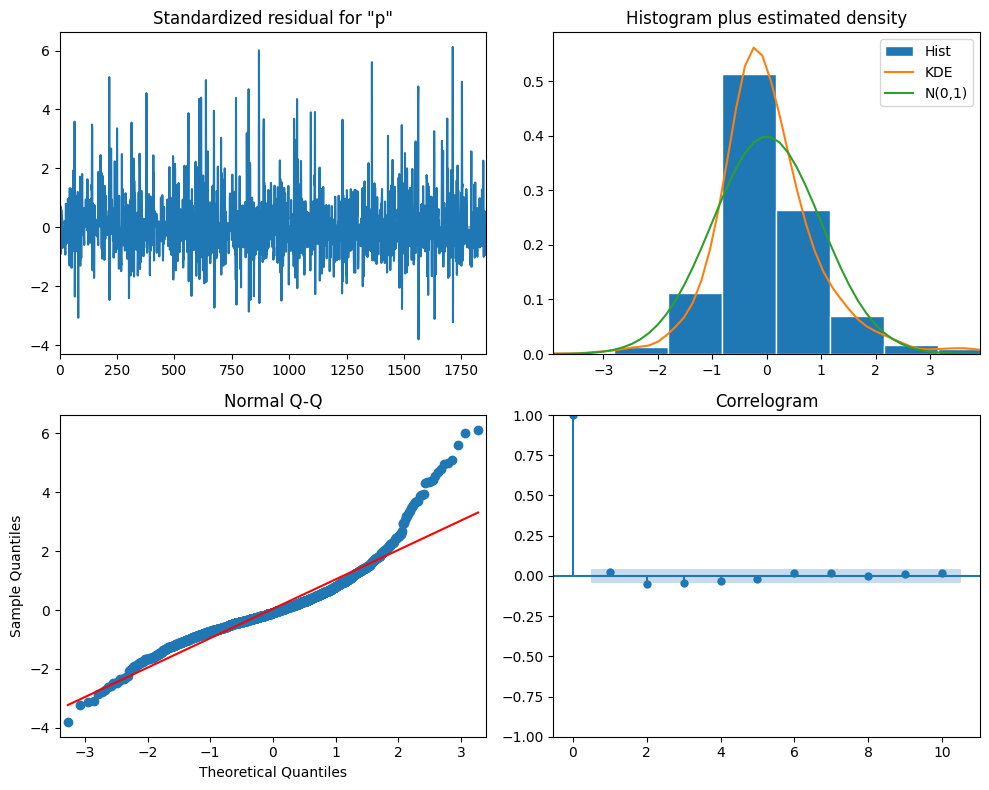


Exogenous Variables Summary:
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
PC1           -0.0163      0.008     -2.051      0.040      -0.032      -0.001
PC2            0.0513      0.012      4.366      0.000       0.028       0.074
PC3           -0.1742      0.011    -16.145      0.000      -0.195      -0.153
PC4            0.0186      0.013      1.486      0.137      -0.006       0.043
ar.L1          0.4013      0.014     28.673      0.000       0.374       0.429
ma.L1         -1.0000      0.456     -2.194      0.028      -1.893      -0.107
sigma2         0.1665      0.077      2.162      0.031       0.016       0.317

ARIMAX Analysis for profit_5y
----------------------------------------


/Users/carlosedm10/projects/fundamental-scores-analysis/venv/lib/python3.13/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/Users/carlosedm10/projects/fundamental-scores-analysis/venv/lib/python3.13/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)


AIC: 3245.43
BIC: 3284.13


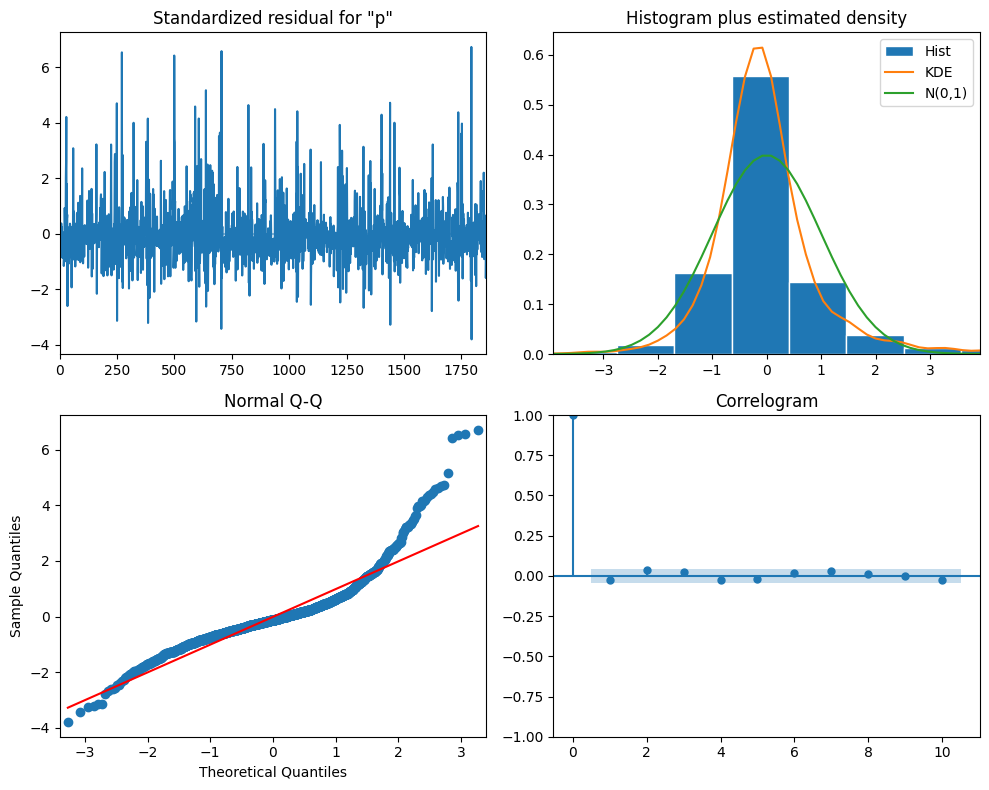


Exogenous Variables Summary:
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
PC1            0.0678      0.011      6.158      0.000       0.046       0.089
PC2            0.1110      0.015      7.618      0.000       0.082       0.140
PC3           -0.3175      0.014    -22.300      0.000      -0.345      -0.290
PC4           -0.0556      0.017     -3.308      0.001      -0.089      -0.023
ar.L1          0.5266      0.012     43.602      0.000       0.503       0.550
ma.L1         -0.9979      0.002   -479.675      0.000      -1.002      -0.994
sigma2         0.3321      0.006     59.371      0.000       0.321       0.343


In [15]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
import numpy as np

# We'll create ARIMAX models for each profit target using PCs as exogenous variables
profit_targets = [
    "profit_1m",
    "profit_3m",
    "profit_6m",
    "profit_1y",
    "profit_2y",
    "profit_5y",
]
exog_vars = df_pca[["PC1", "PC2", "PC3", "PC4"]]

for target in profit_targets:
    print(f"\nARIMAX Analysis for {target}")
    print("-" * 40)

    # Prepare the target variable
    y = df_pca[target]

    try:
        # Fit ARIMAX model
        # Using order=(1,1,1) as a starting point - these parameters can be tuned
        model = SARIMAX(
            y,
            exog=exog_vars,
            order=(1, 1, 1),
            enforce_stationarity=False,
            enforce_invertibility=False,
        )

        results = model.fit()

        # Print model summary
        print(f"AIC: {results.aic:.2f}")
        print(f"BIC: {results.bic:.2f}")

        # Plot diagnostics
        fig = results.plot_diagnostics(figsize=(10, 8))
        plt.tight_layout()
        plt.show()

        # Print summary of exogenous variables impact
        print("\nExogenous Variables Summary:")
        print(results.summary().tables[1])

    except Exception as e:
        print(f"Error fitting model for {target}: {str(e)}")

### Including dummy variables


ARIMAX Analysis for profit_1m with Dummy Variables
--------------------------------------------------


/Users/carlosedm10/projects/fundamental-scores-analysis/venv/lib/python3.13/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC: -3457.00
BIC: -3056.93


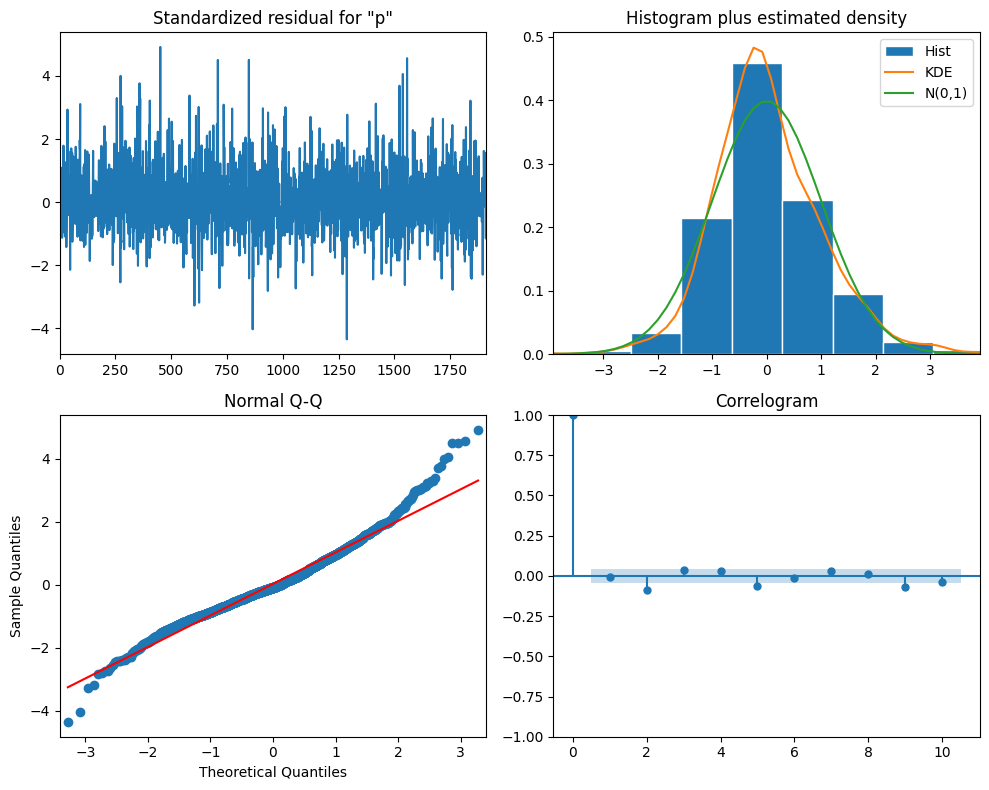


Exogenous Variables Summary:
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
PC1                              -0.0003      0.002     -0.159      0.874      -0.004       0.003
PC2                               0.0067      0.002      2.904      0.004       0.002       0.011
PC3                              -0.0137      0.002     -5.660      0.000      -0.018      -0.009
PC4                               0.0018      0.003      0.725      0.469      -0.003       0.007
country_BD                       -0.0230      0.021     -1.095      0.273      -0.064       0.018
country_BE                        0.0961      0.053      1.800      0.072      -0.009       0.201
country_BM                       -0.0241      0.028     -0.851      0.395      -0.080       0.031
country_BR                        0.0171      0.028      0.617      0.537      -0.037   

/Users/carlosedm10/projects/fundamental-scores-analysis/venv/lib/python3.13/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC: -1932.41
BIC: -1532.35


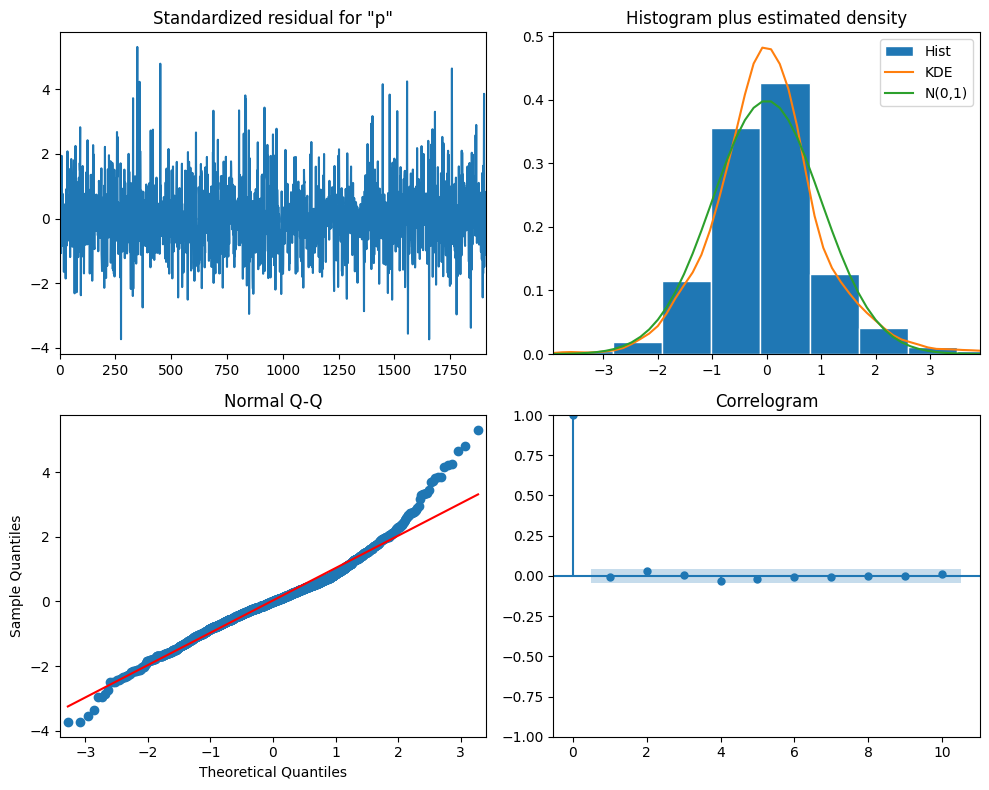


Exogenous Variables Summary:
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
PC1                              -0.0165      0.003     -5.588      0.000      -0.022      -0.011
PC2                               0.0198      0.004      5.441      0.000       0.013       0.027
PC3                              -0.0379      0.004     -9.920      0.000      -0.045      -0.030
PC4                               0.0117      0.004      2.957      0.003       0.004       0.019
country_BD                       -0.0066      0.033     -0.201      0.841      -0.071       0.057
country_BE                        0.0999      0.160      0.623      0.533      -0.214       0.414
country_BM                       -0.0377      0.046     -0.813      0.416      -0.129       0.053
country_BR                       -0.0352      0.071     -0.497      0.619      -0.174   

/Users/carlosedm10/projects/fundamental-scores-analysis/venv/lib/python3.13/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC: -100.60
BIC: 299.46


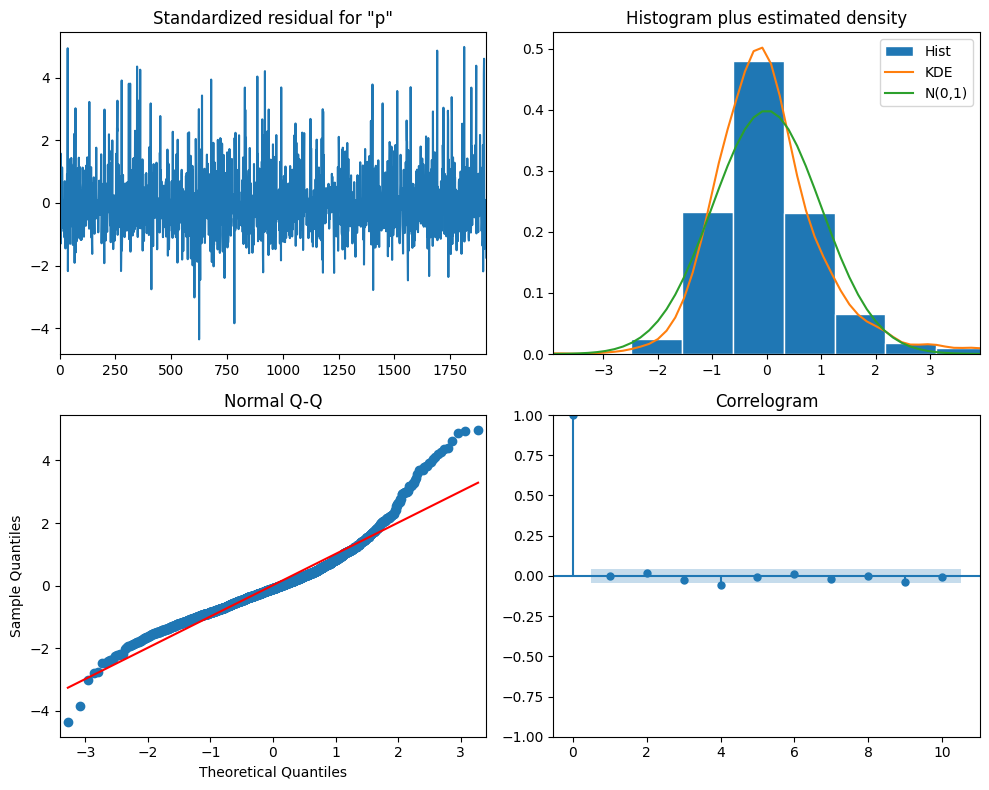


Exogenous Variables Summary:
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
PC1                              -0.0289      0.005     -5.668      0.000      -0.039      -0.019
PC2                               0.0251      0.006      3.962      0.000       0.013       0.038
PC3                              -0.0628      0.006    -10.040      0.000      -0.075      -0.051
PC4                               0.0220      0.007      3.149      0.002       0.008       0.036
country_BD                       -0.0066      0.069     -0.095      0.924      -0.142       0.129
country_BE                        0.0366      0.166      0.220      0.826      -0.289       0.362
country_BM                       -0.0169      0.095     -0.178      0.859      -0.203       0.169
country_BR                        0.0288      0.105      0.273      0.785      -0.178   

/Users/carlosedm10/projects/fundamental-scores-analysis/venv/lib/python3.13/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC: 896.27
BIC: 1296.33


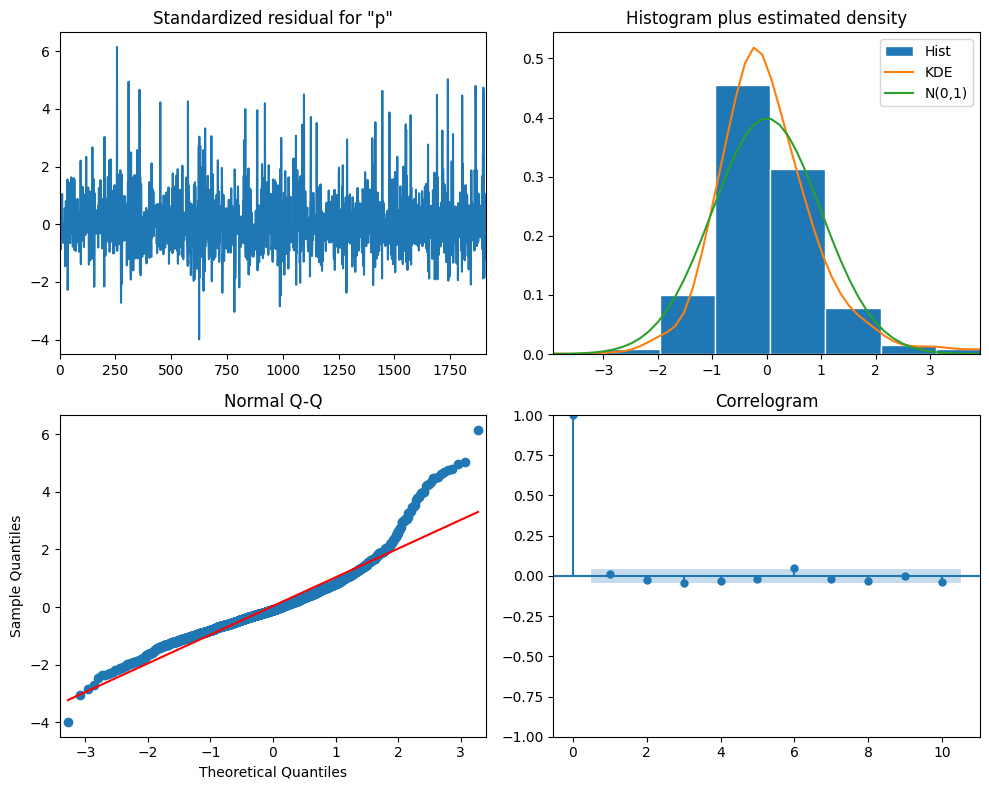


Exogenous Variables Summary:
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
PC1                              -0.0429      0.007     -6.319      0.000      -0.056      -0.030
PC2                               0.0447      0.009      4.921      0.000       0.027       0.062
PC3                              -0.0856      0.009     -9.912      0.000      -0.103      -0.069
PC4                               0.0420      0.010      4.399      0.000       0.023       0.061
country_BD                       -0.1340      0.128     -1.047      0.295      -0.385       0.117
country_BE                       -0.2295      0.651     -0.353      0.724      -1.505       1.046
country_BM                       -0.1039      0.176     -0.591      0.554      -0.448       0.241
country_BR                       -0.0260      0.128     -0.202      0.840      -0.278   

/Users/carlosedm10/projects/fundamental-scores-analysis/venv/lib/python3.13/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC: 2055.51
BIC: 2455.57


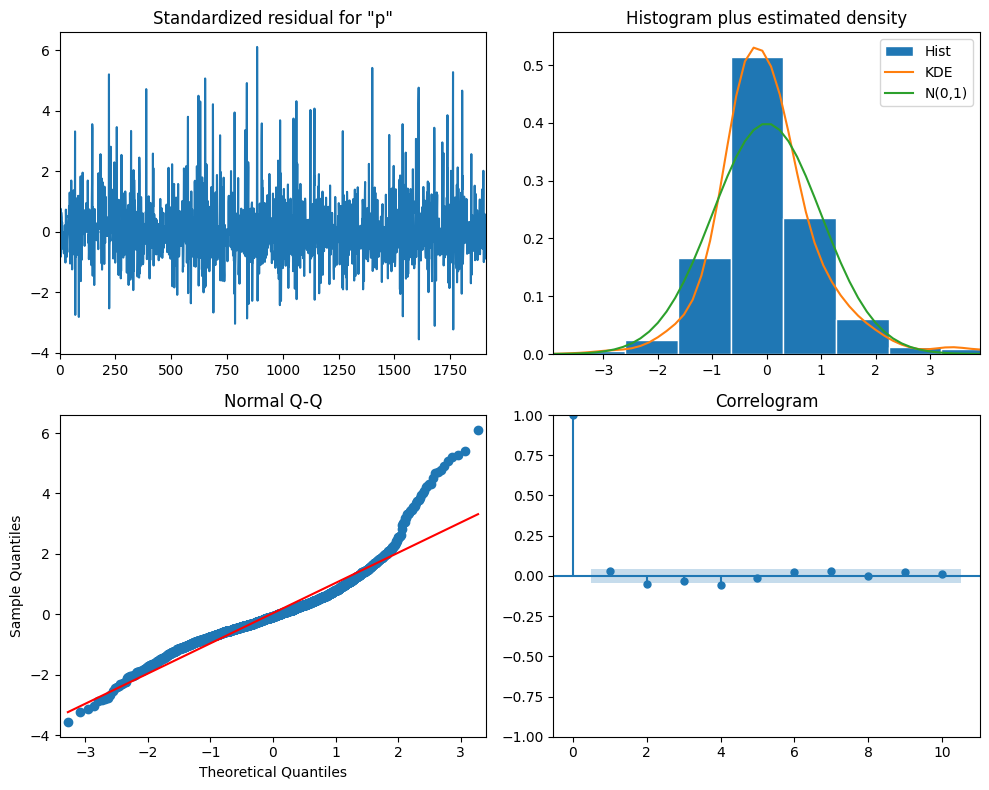


Exogenous Variables Summary:
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
PC1                              -0.0158      0.009     -1.717      0.086      -0.034       0.002
PC2                               0.0467      0.012      3.833      0.000       0.023       0.071
PC3                              -0.1681      0.011    -14.949      0.000      -0.190      -0.146
PC4                               0.0181      0.013      1.425      0.154      -0.007       0.043
country_BD                       -0.2008      0.134     -1.499      0.134      -0.463       0.062
country_BE                       -0.4773      0.765     -0.624      0.532      -1.976       1.021
country_BM                       -0.0419      0.261     -0.160      0.873      -0.554       0.470
country_BR                       -0.0869      0.148     -0.586      0.558      -0.377   

/Users/carlosedm10/projects/fundamental-scores-analysis/venv/lib/python3.13/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC: 3397.16
BIC: 3797.22


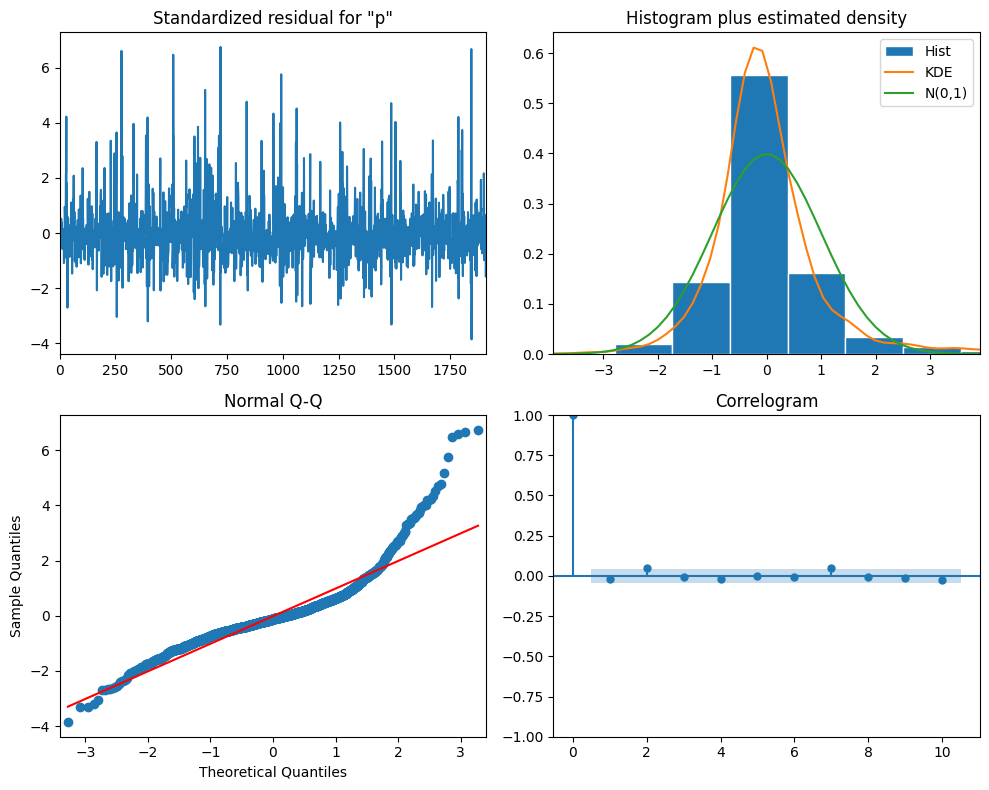


Exogenous Variables Summary:
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
PC1                               0.0614      0.012      5.151      0.000       0.038       0.085
PC2                               0.0981      0.016      6.310      0.000       0.068       0.129
PC3                              -0.3124      0.016    -20.068      0.000      -0.343      -0.282
PC4                              -0.0496      0.017     -2.843      0.004      -0.084      -0.015
country_BD                        0.0595      0.168      0.354      0.723      -0.270       0.389
country_BE                       -0.7385      0.871     -0.847      0.397      -2.447       0.970
country_BM                       -0.1124      0.484     -0.232      0.816      -1.060       0.836
country_BR                        0.1883      0.228      0.826      0.409      -0.259   

In [12]:
# Convert categorical variables to string type
df_pca["country"] = df["country"].astype(str)
df_pca["sector"] = df["sector"].astype(str)

# Create dummy variables for categorical columns
dummy_country = pd.get_dummies(df_pca["country"], prefix="country")
dummy_sector = pd.get_dummies(df_pca["sector"], prefix="sector")

# Combine PCA components with dummy variables
exog_vars_with_dummies = pd.concat([exog_vars, dummy_country, dummy_sector], axis=1)

# Drop one category from each dummy variable group to avoid multicollinearity
exog_vars_with_dummies = exog_vars_with_dummies.drop(
    columns=[dummy_country.columns[0], dummy_sector.columns[0]]
)

# Convert all columns to numeric type
exog_vars_with_dummies = exog_vars_with_dummies.astype(float)

for target in profit_targets:
    print(f"\nARIMAX Analysis for {target} with Dummy Variables")
    print("-" * 50)

    # Prepare the target variable and ensure numeric type
    y = df_pca[target].astype(float)

    try:
        # Fit ARIMAX model with dummy variables
        model = SARIMAX(
            y,
            exog=exog_vars_with_dummies,
            order=(1, 1, 1),
            enforce_stationarity=False,
            enforce_invertibility=False,
        )

        results = model.fit()

        # Print model summary
        print(f"AIC: {results.aic:.2f}")
        print(f"BIC: {results.bic:.2f}")

        # Plot diagnostics
        fig = results.plot_diagnostics(figsize=(10, 8))
        plt.tight_layout()
        plt.show()

        # Print summary of exogenous variables impact
        print("\nExogenous Variables Summary:")
        print(results.summary().tables[1])

    except Exception as e:
        print(f"Error fitting model for {target}: {str(e)}")

# Prophet

/Users/carlosedm10/projects/fundamental-scores-analysis/venv/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Importing plotly failed. Interactive plots will not work.


shapes: (1916, 18) (1916, 12)
        PC1       PC2       PC3       PC4  profit_1m  profit_3m  profit_6m  \
0 -0.616763  1.048850  0.638663  0.342794  -0.051239   0.006651   0.016658   
1 -0.931562  0.806187  0.457810 -0.063425   0.003208   0.010006  -0.043546   
2 -0.869095  0.727330  0.587554 -0.103254  -0.020890  -0.002595   0.011493   
3 -0.504467  1.078575  0.564440 -0.765173  -0.018635  -0.021929  -0.036217   
4 -0.557278  1.055991  0.514356 -0.741239   0.006187  -0.014871  -0.065858   

   profit_1y  profit_2y  profit_5y country       sector        date  
0   0.114412  -0.014940   0.040468      NZ  Real Estate  2024-11-01  
1  -0.070544  -0.116168   0.078055      NZ  Real Estate  2024-08-01  
2  -0.037498  -0.199315   0.296551      NZ  Real Estate  2024-03-01  
3  -0.085494  -0.253532   0.436577      NZ  Real Estate  2023-06-01  
4  -0.169314  -0.242305   0.483670      NZ  Real Estate  2023-03-01  
Prophet Analysis
--------------------------------------------------

Prophet Anal

14:13:35 - cmdstanpy - INFO - Chain [1] start processing
14:13:35 - cmdstanpy - INFO - Chain [1] done processing


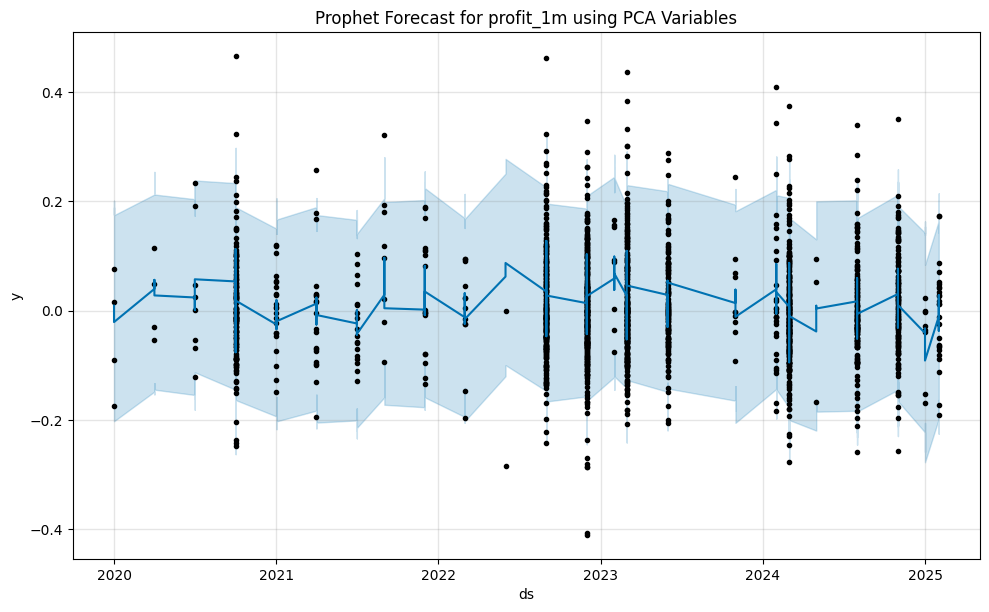

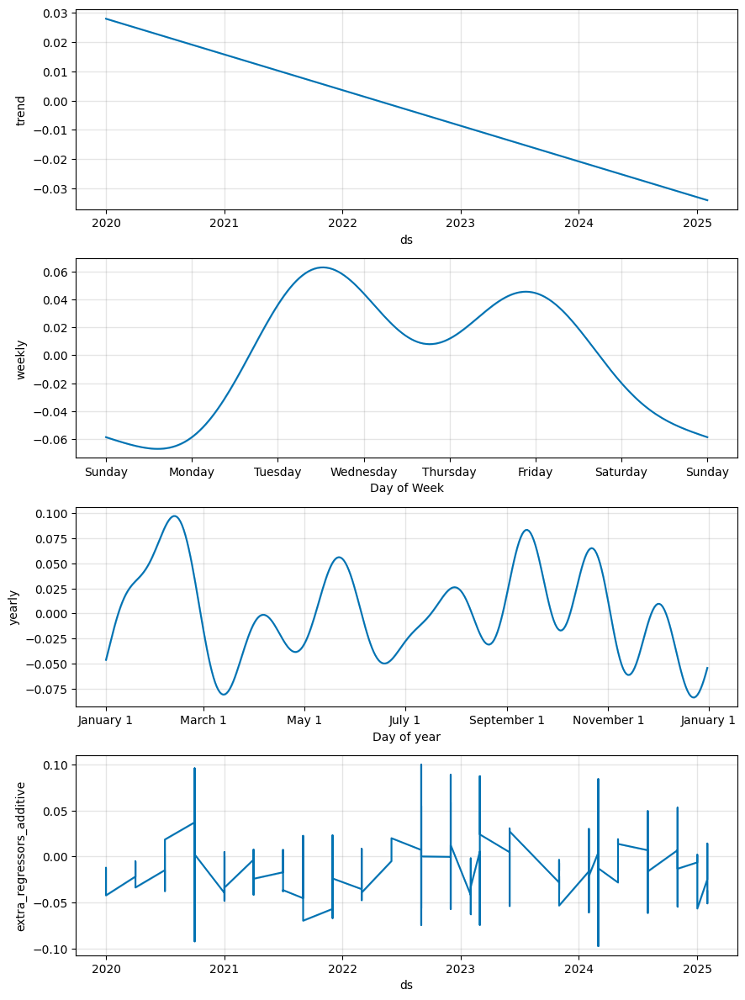

14:13:35 - cmdstanpy - INFO - Chain [1] start processing
14:13:35 - cmdstanpy - INFO - Chain [1] done processing


Model Metrics:
RMSE: 0.0995
MAE: 0.0748

Model with Original Scores:


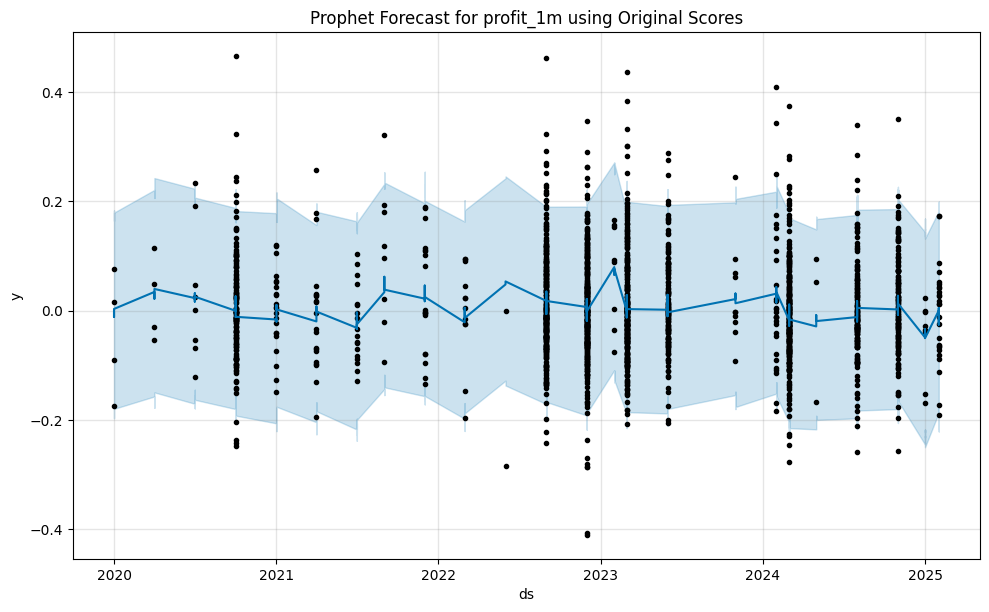

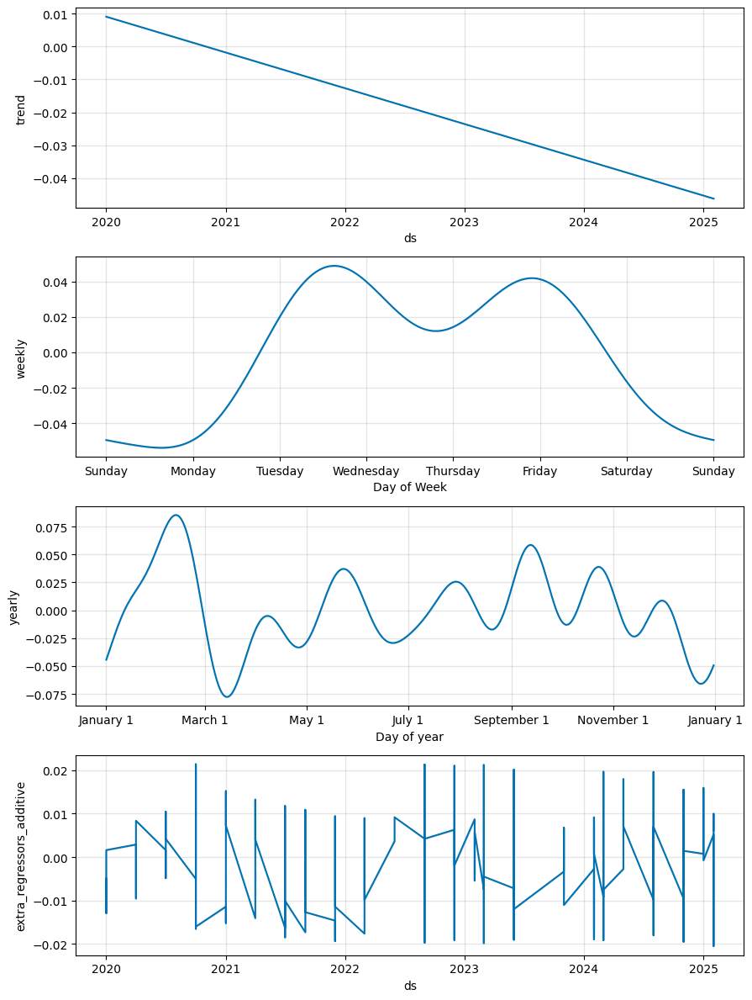

Model Metrics:
RMSE: 0.0985
MAE: 0.0743

Comparison for profit_1m:
------------------------------
PCA Variables:
RMSE: 0.0995
MAE: 0.0748

Original Scores:
RMSE: 0.0985
MAE: 0.0743


Prophet Analysis for profit_3m
------------------------------

Model with PCA Variables:


14:13:36 - cmdstanpy - INFO - Chain [1] start processing
14:13:36 - cmdstanpy - INFO - Chain [1] done processing


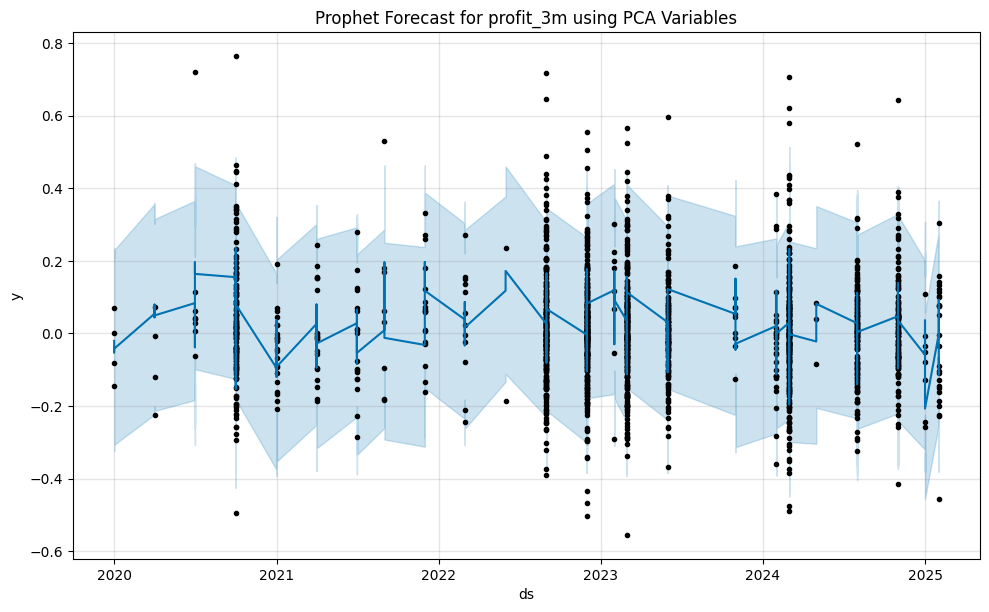

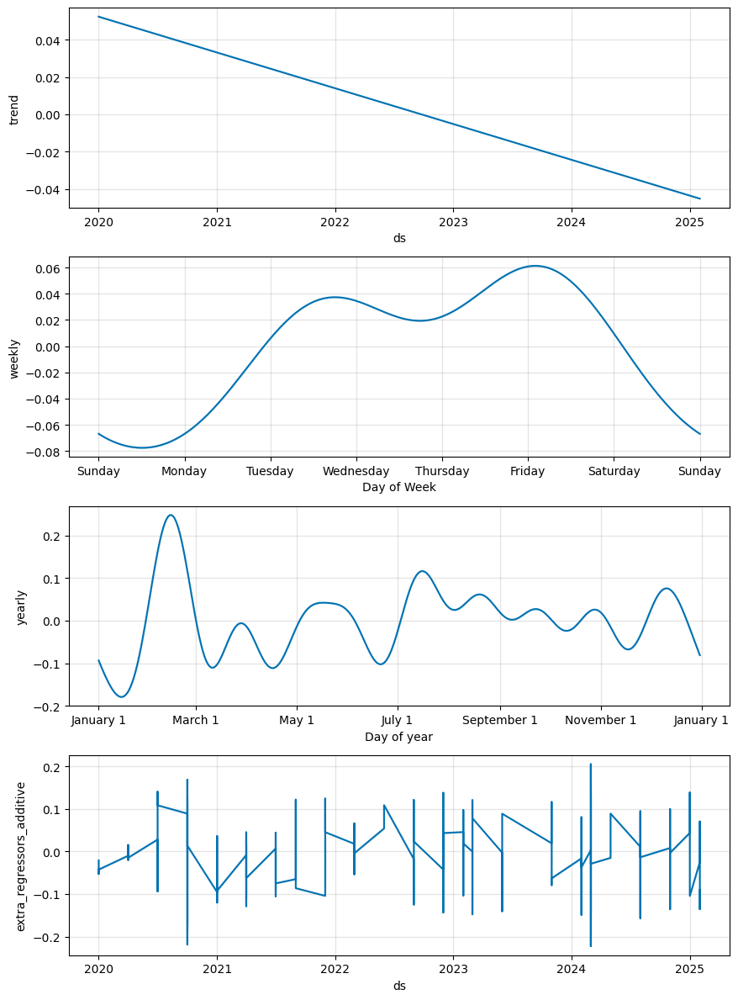

14:13:37 - cmdstanpy - INFO - Chain [1] start processing
14:13:37 - cmdstanpy - INFO - Chain [1] done processing


Model Metrics:
RMSE: 0.1601
MAE: 0.1189

Model with Original Scores:


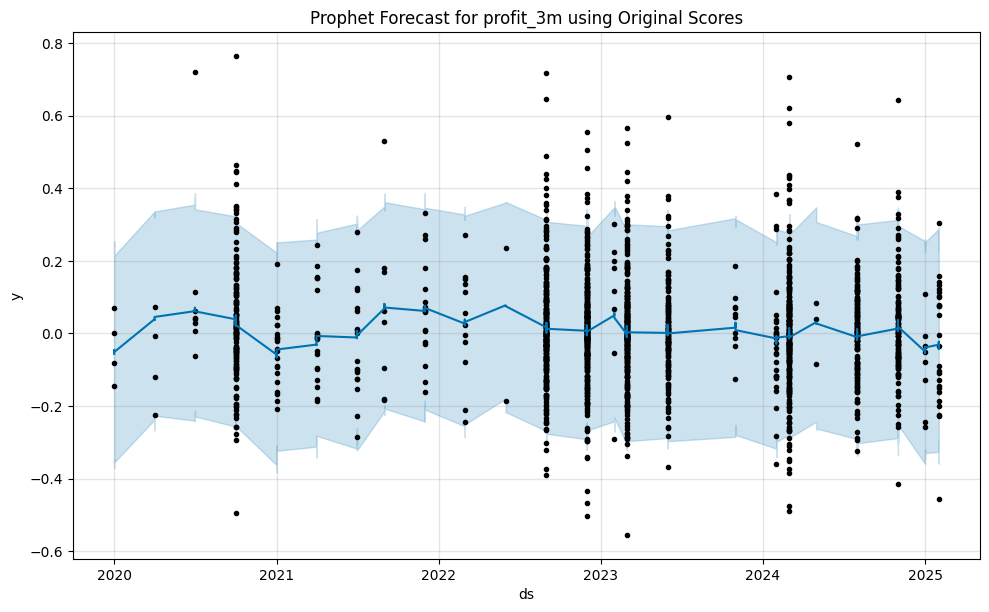

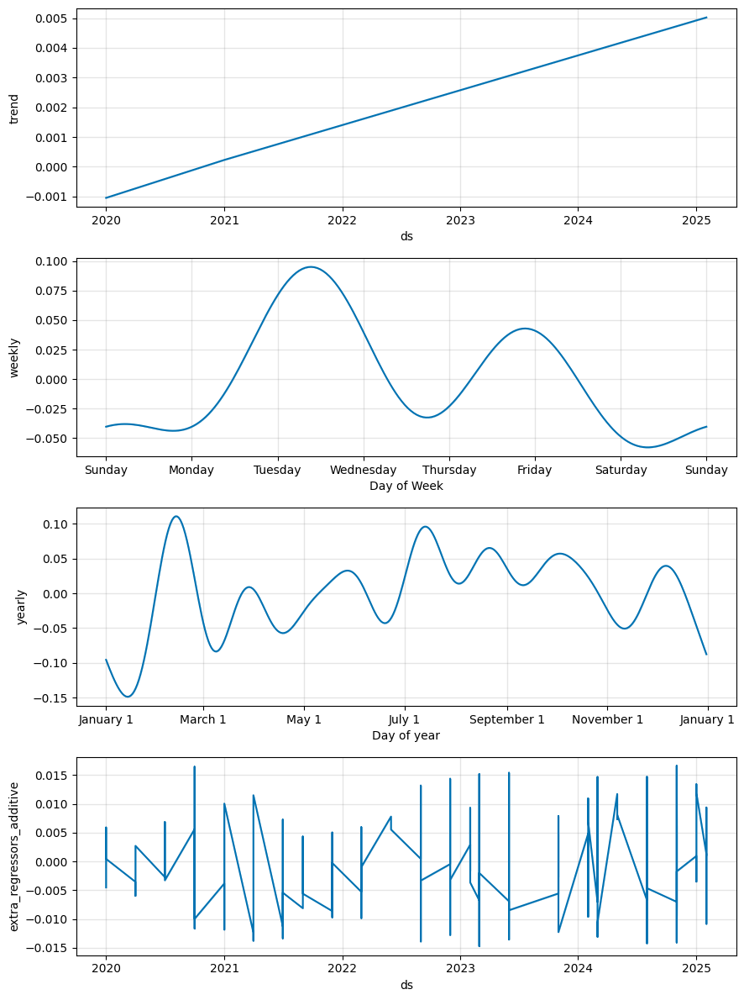

14:13:38 - cmdstanpy - INFO - Chain [1] start processing


Model Metrics:
RMSE: 0.1511
MAE: 0.1100

Comparison for profit_3m:
------------------------------
PCA Variables:
RMSE: 0.1601
MAE: 0.1189

Original Scores:
RMSE: 0.1511
MAE: 0.1100


Prophet Analysis for profit_6m
------------------------------

Model with PCA Variables:


14:13:38 - cmdstanpy - INFO - Chain [1] done processing


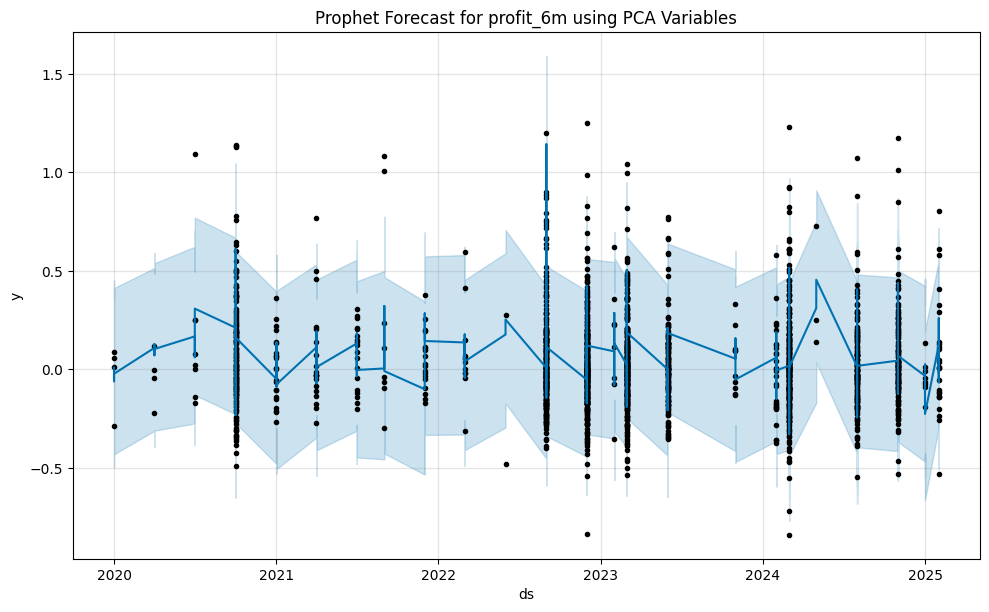

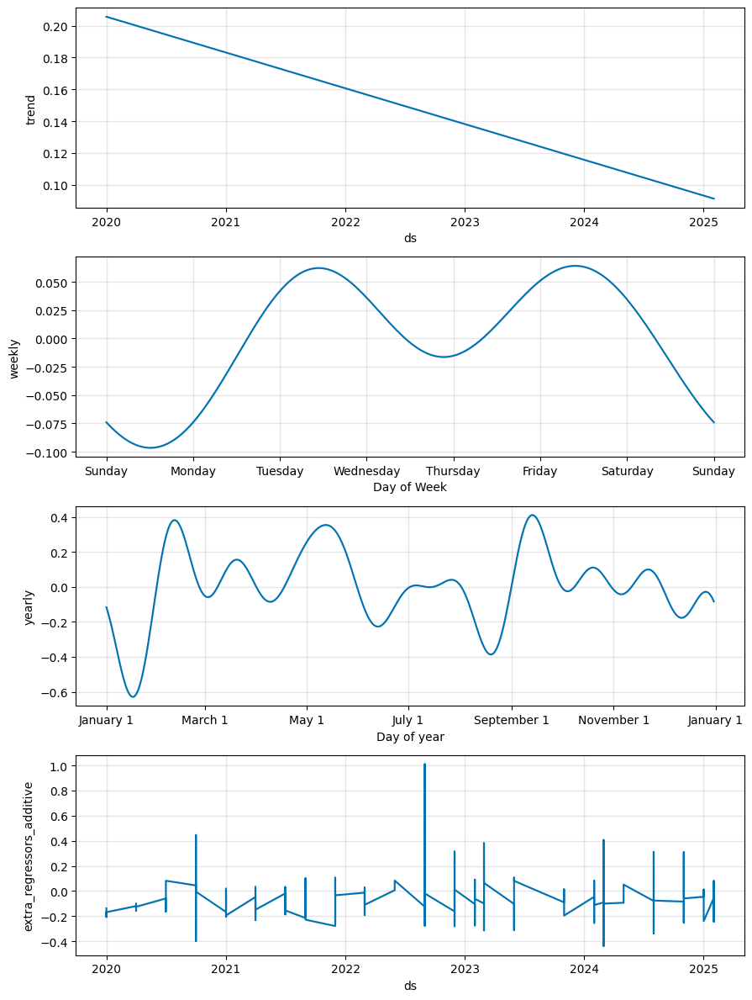

14:13:39 - cmdstanpy - INFO - Chain [1] start processing
14:13:39 - cmdstanpy - INFO - Chain [1] done processing


Model Metrics:
RMSE: 0.2588
MAE: 0.1908

Model with Original Scores:


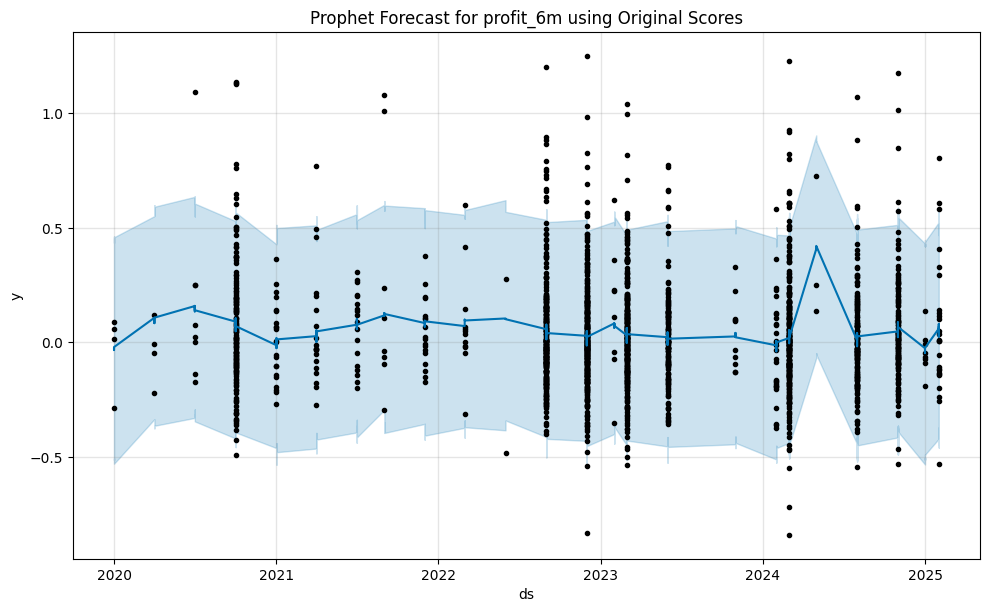

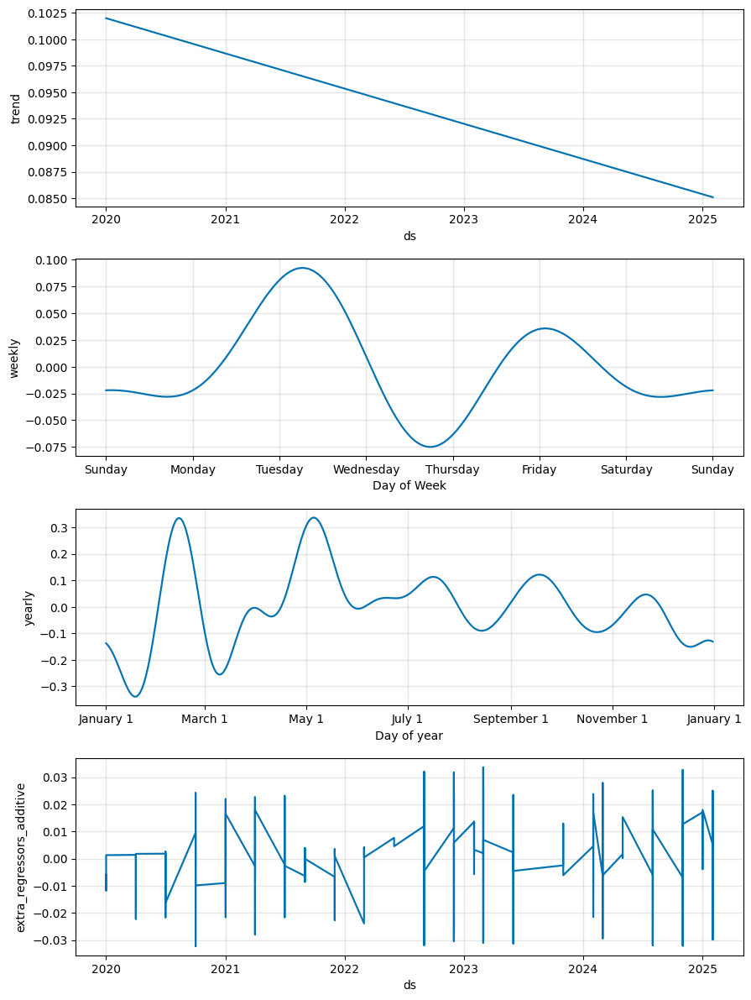

14:13:39 - cmdstanpy - INFO - Chain [1] start processing


Model Metrics:
RMSE: 0.2432
MAE: 0.1774

Comparison for profit_6m:
------------------------------
PCA Variables:
RMSE: 0.2588
MAE: 0.1908

Original Scores:
RMSE: 0.2432
MAE: 0.1774


Prophet Analysis for profit_1y
------------------------------

Model with PCA Variables:


14:13:40 - cmdstanpy - INFO - Chain [1] done processing


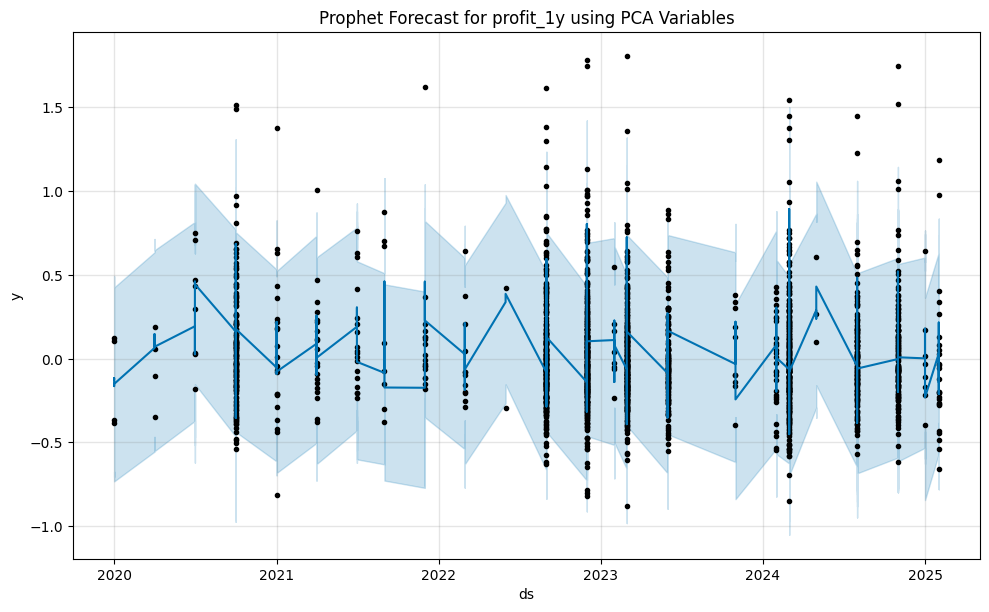

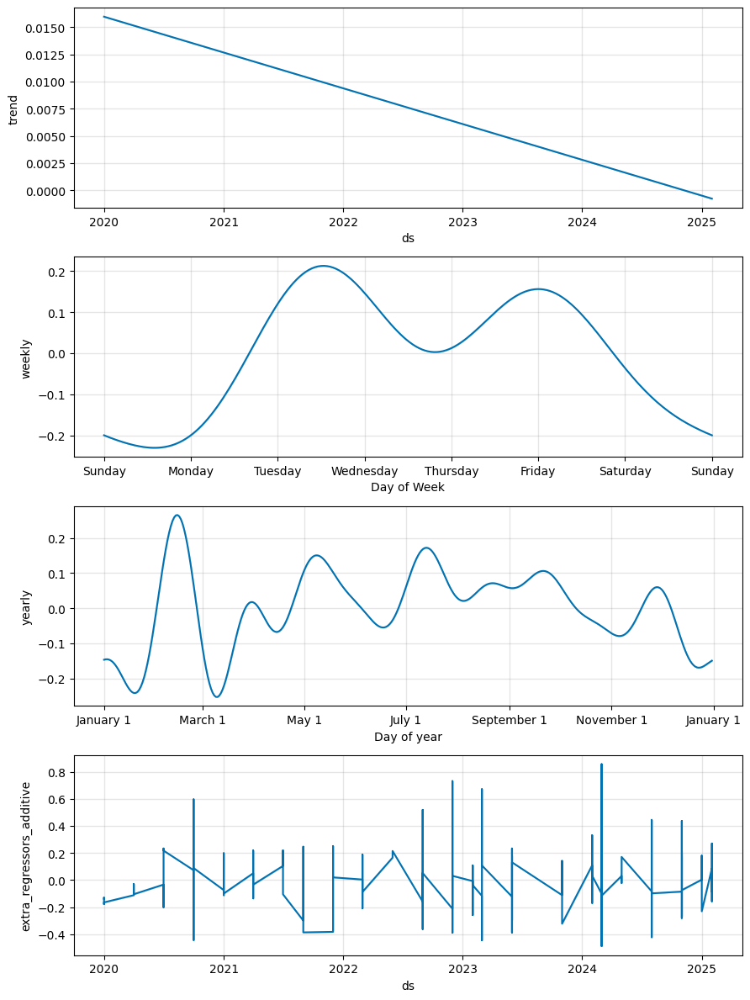

14:13:40 - cmdstanpy - INFO - Chain [1] start processing
14:13:40 - cmdstanpy - INFO - Chain [1] done processing


Model Metrics:
RMSE: 0.3485
MAE: 0.2613

Model with Original Scores:


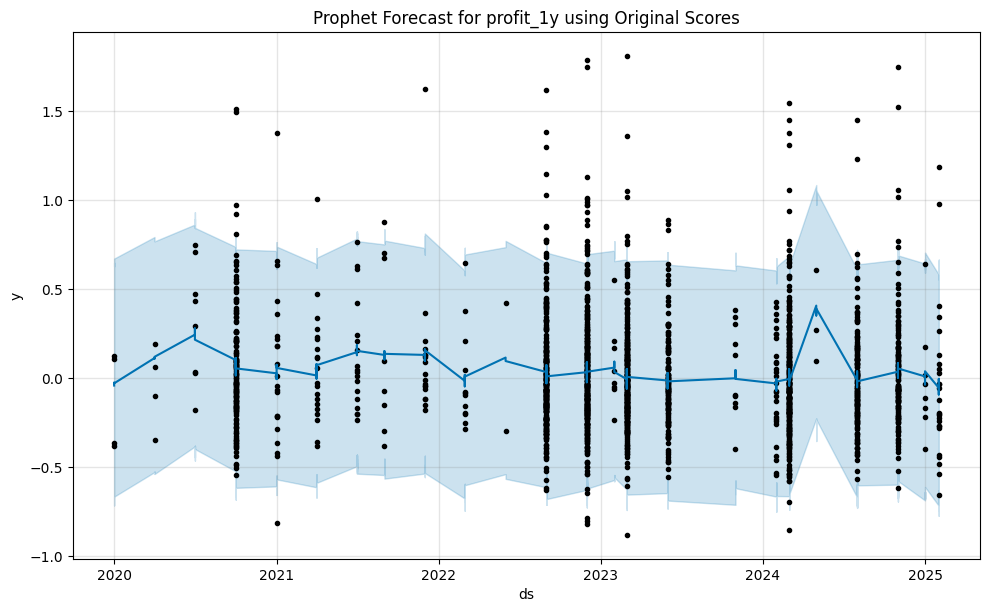

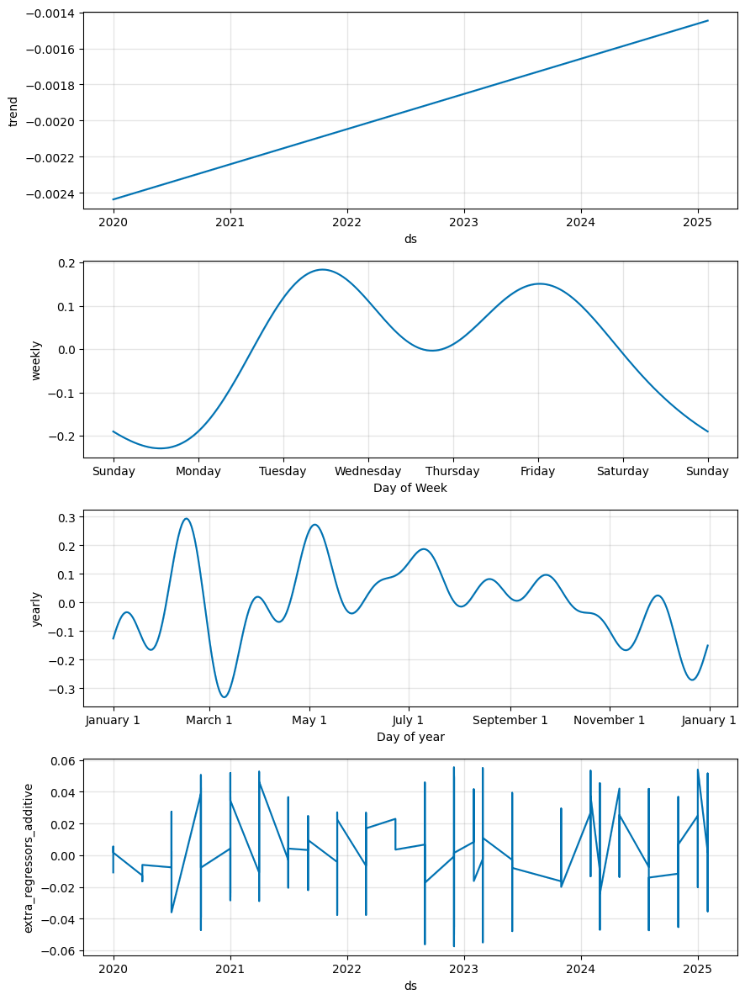

14:13:41 - cmdstanpy - INFO - Chain [1] start processing


Model Metrics:
RMSE: 0.3271
MAE: 0.2415

Comparison for profit_1y:
------------------------------
PCA Variables:
RMSE: 0.3485
MAE: 0.2613

Original Scores:
RMSE: 0.3271
MAE: 0.2415


Prophet Analysis for profit_2y
------------------------------

Model with PCA Variables:


14:13:41 - cmdstanpy - INFO - Chain [1] done processing


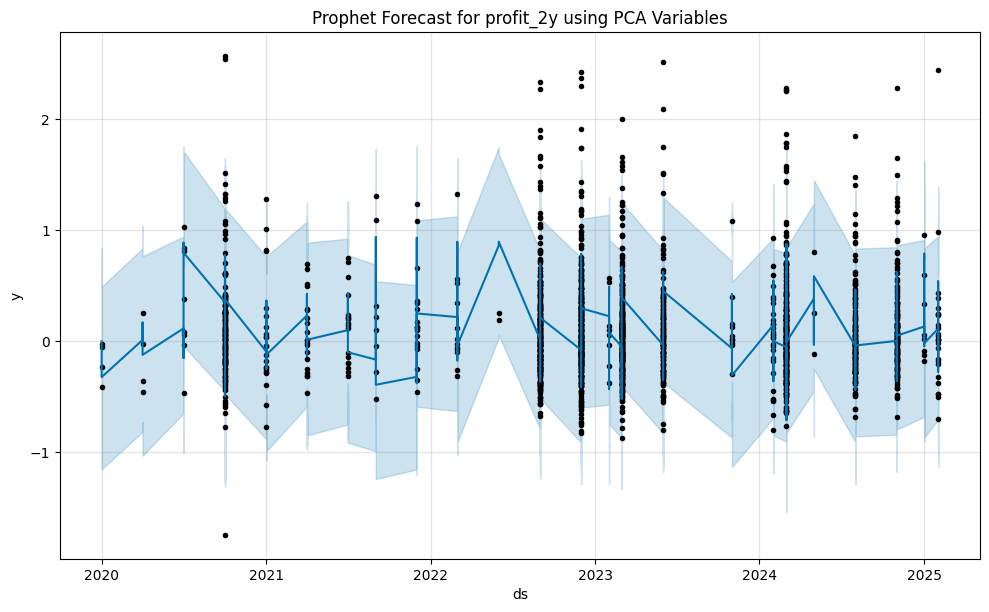

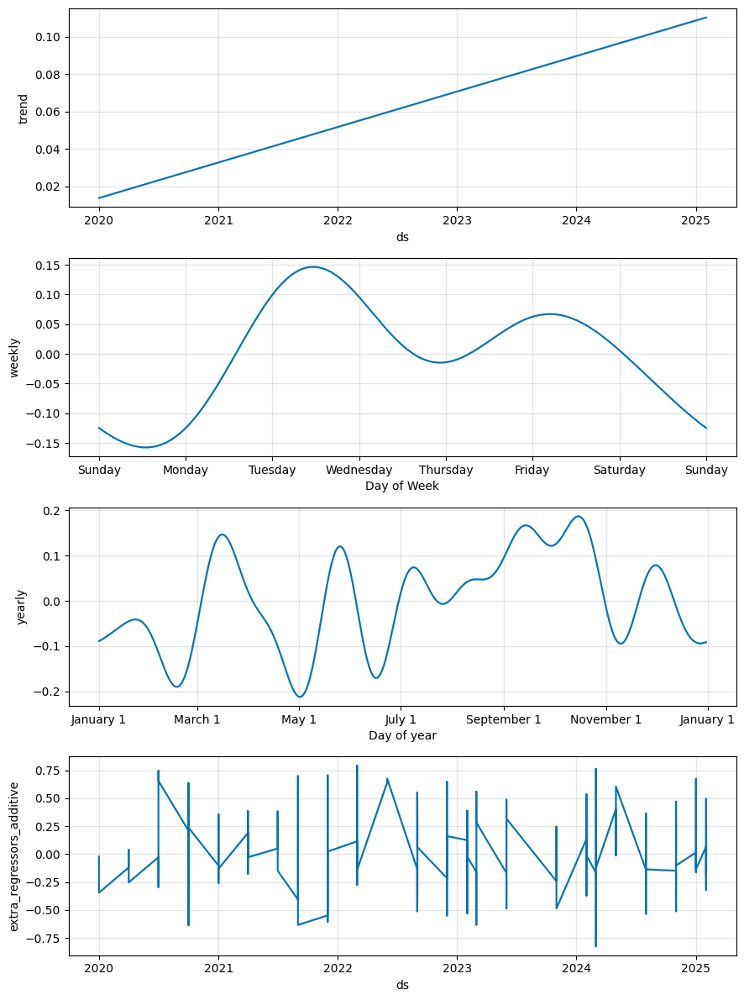

14:13:42 - cmdstanpy - INFO - Chain [1] start processing
14:13:42 - cmdstanpy - INFO - Chain [1] done processing


Model Metrics:
RMSE: 0.5158
MAE: 0.3730

Model with Original Scores:


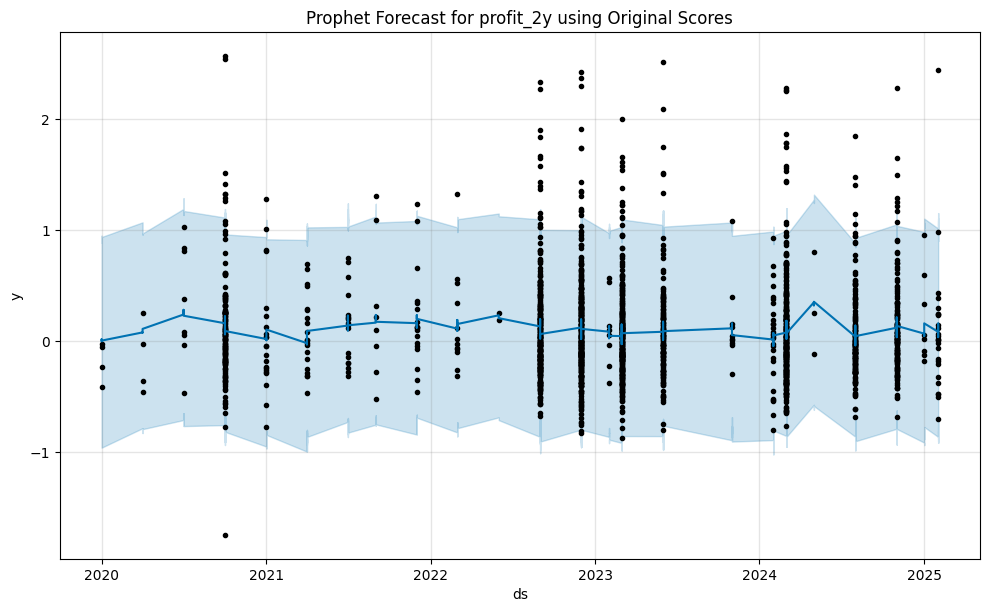

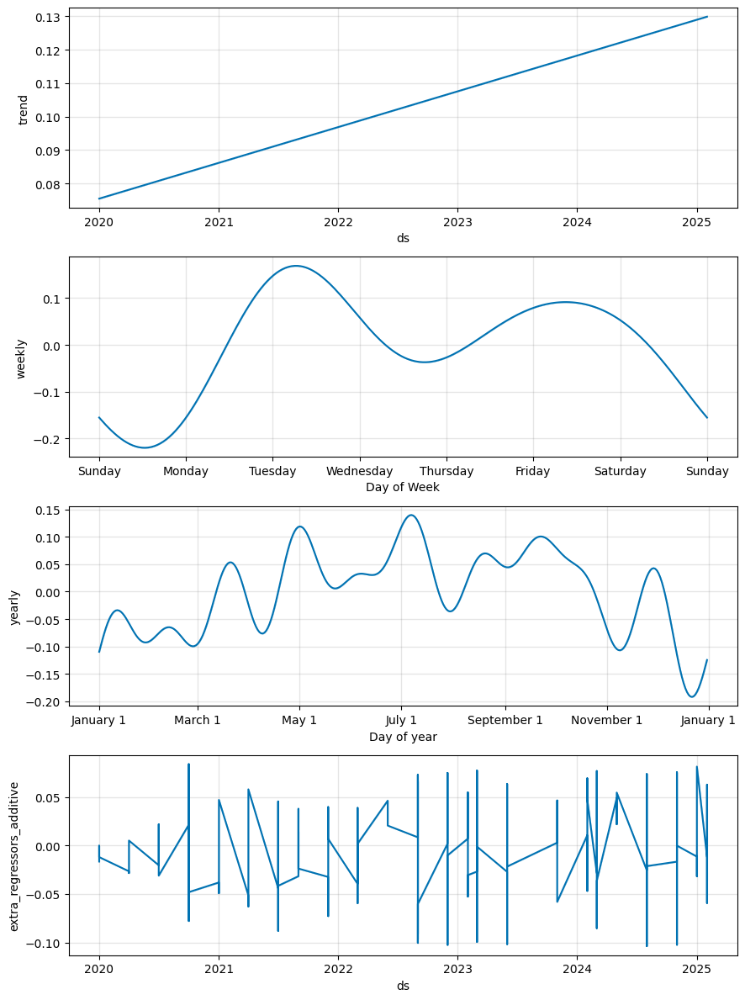

14:13:43 - cmdstanpy - INFO - Chain [1] start processing


Model Metrics:
RMSE: 0.4857
MAE: 0.3459

Comparison for profit_2y:
------------------------------
PCA Variables:
RMSE: 0.5158
MAE: 0.3730

Original Scores:
RMSE: 0.4857
MAE: 0.3459


Prophet Analysis for profit_5y
------------------------------

Model with PCA Variables:


14:13:43 - cmdstanpy - INFO - Chain [1] done processing


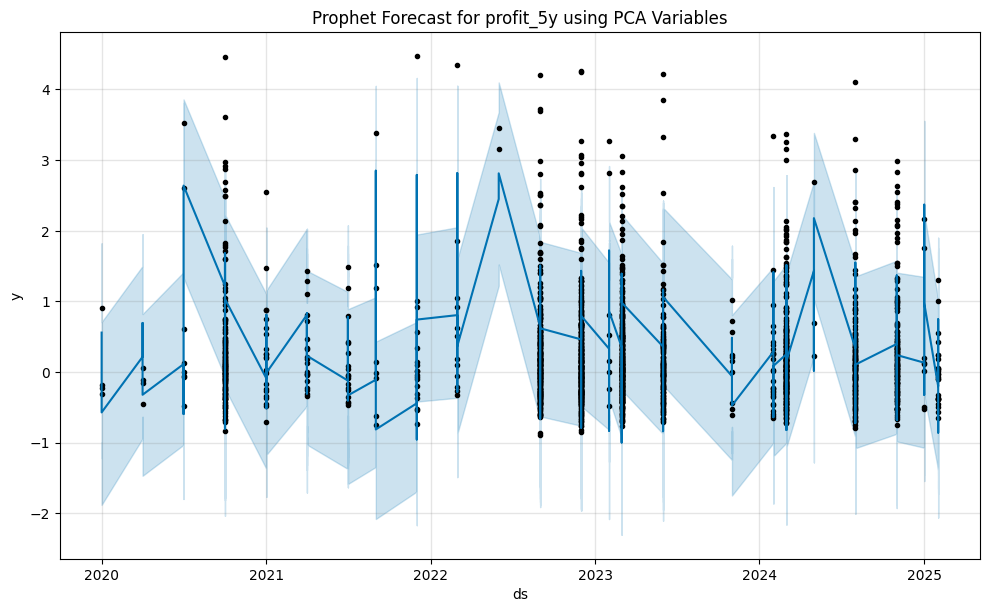

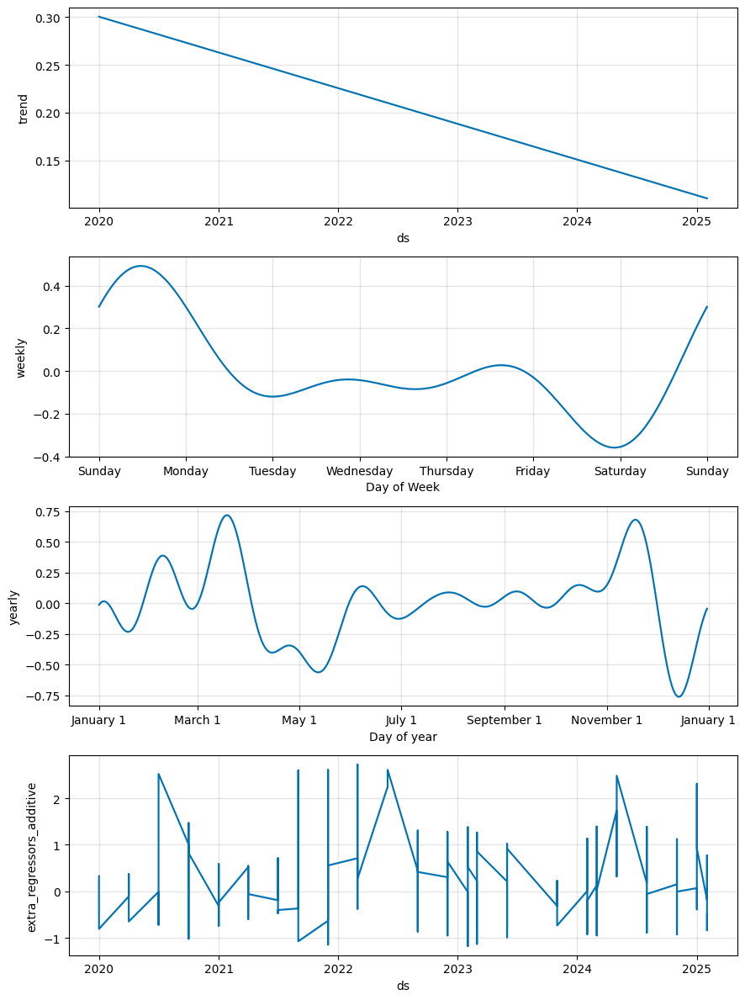

14:13:43 - cmdstanpy - INFO - Chain [1] start processing
14:13:43 - cmdstanpy - INFO - Chain [1] done processing


Model Metrics:
RMSE: 0.8982
MAE: 0.6510

Model with Original Scores:


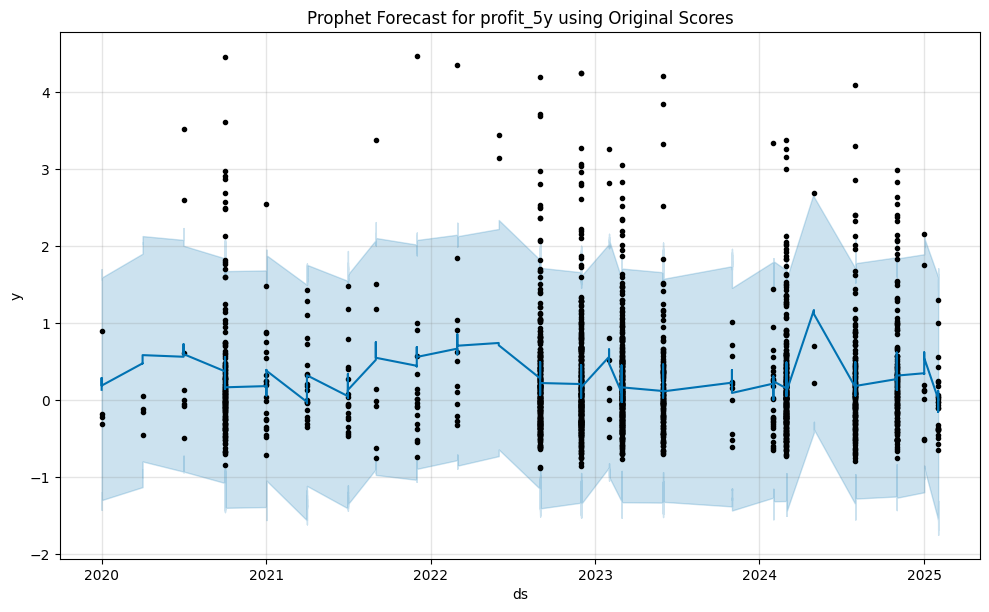

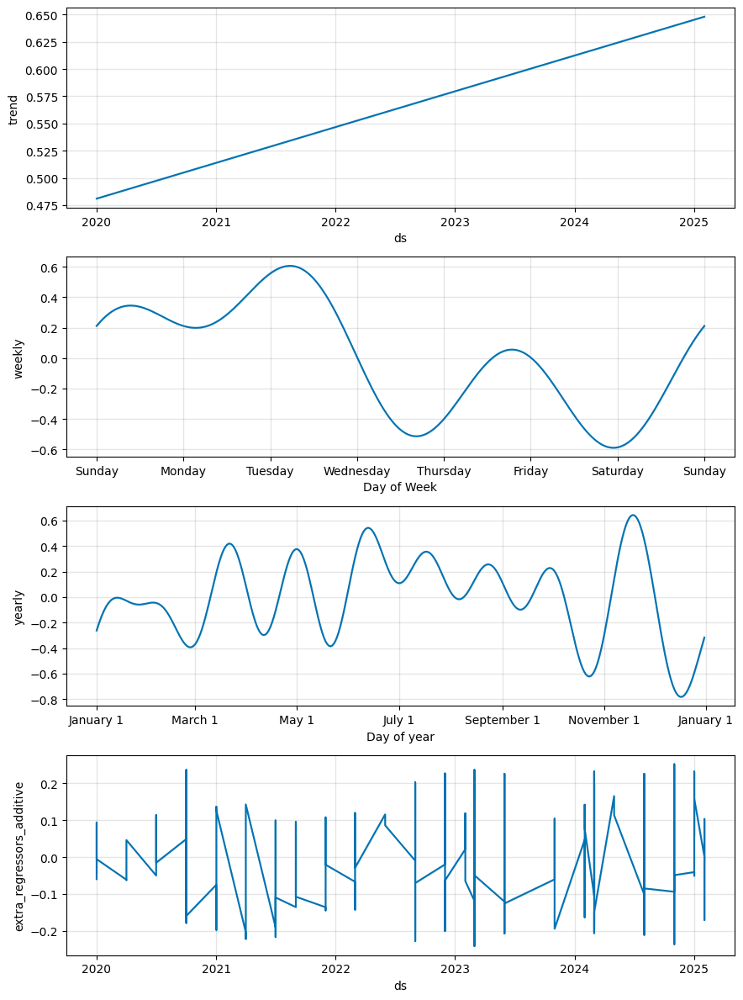

Model Metrics:
RMSE: 0.7967
MAE: 0.5536

Comparison for profit_5y:
------------------------------
PCA Variables:
RMSE: 0.8982
MAE: 0.6510

Original Scores:
RMSE: 0.7967
MAE: 0.5536



In [13]:
# Import Prophet
from prophet import Prophet
import pandas as pd

# Checking df format
# assert df.shape[0] == df_pca.shape[0]
print("shapes:", df.shape, df_pca.shape)

df_pca["date"] = df["date"]
print(df_pca.head())

# Drop nan values
df_pca = df_pca.dropna()

# Define original score columns
original_scores = ["quality", "value", "growth", "dividend"]

print("Prophet Analysis")
print("-" * 50)

for target in profit_targets:
    print(f"\nProphet Analysis for {target}")
    print("-" * 30)

    results = []

    # Run two models - one with PCA variables, one with original scores
    for model_type, features in [
        ("PCA Variables", exog_vars_with_dummies),
        ("Original Scores", df[original_scores]),
    ]:
        try:
            print(f"\nModel with {model_type}:")

            # Prepare data in Prophet format
            prophet_df = pd.DataFrame({"ds": df_pca["date"], "y": df_pca[target]})

            # Add features as additional regressors
            for col in features.columns:
                prophet_df[col] = features[col]

            # Initialize and fit Prophet model
            model = Prophet(
                yearly_seasonality=True,
                weekly_seasonality=True,
                daily_seasonality=False,
                interval_width=0.95,
            )

            # Add features as regressors
            for col in features.columns:
                model.add_regressor(col)

            model.fit(prophet_df)

            # Make predictions on the training set
            forecast = model.predict(prophet_df)

            # Plot the results
            fig = model.plot(forecast)
            plt.title(f"Prophet Forecast for {target} using {model_type}")
            plt.show()

            # Plot components
            fig = model.plot_components(forecast)
            plt.show()

            # Calculate metrics
            mse = np.mean((forecast["yhat"] - prophet_df["y"]) ** 2)
            rmse = np.sqrt(mse)
            mae = np.mean(np.abs(forecast["yhat"] - prophet_df["y"]))

            results.append({"model": model_type, "rmse": rmse, "mae": mae})

            print(f"Model Metrics:")
            print(f"RMSE: {rmse:.4f}")
            print(f"MAE: {mae:.4f}")

        except Exception as e:
            print(
                f"Error fitting Prophet model for {target} with {model_type}: {str(e)}"
            )

    # Compare results
    print(f"\nComparison for {target}:")
    print("-" * 30)
    for result in results:
        print(f"{result['model']}:")
        print(f"RMSE: {result['rmse']:.4f}")
        print(f"MAE: {result['mae']:.4f}")
        print()